# Driver Drowsiness Detection 

Drowsiness of drivers constitutes a predominant factor contributing to a substantial proportion of vehicular accidents within the United States.

The primary goal of our study is to investigate various Convolutional Neural Network (CNN) methodologies, with the overarching objective of developing a robust model capable of effectively generalizing to novel visual data instances. This research endeavor is motivated by a commitment to advancing public safety and reducing the incidence of road accidents.

The the initial part of the notebook is code. To understand about dataset, preprocessing, models experimented and their results click [here](#dataset-eda) 

In [1]:
# Importing necessary libraries
import os
import pandas as pd
import numpy as np
import random
from PIL import Image

import tensorflow as tf
from tensorflow import keras
from keras import models
from keras import layers
from keras.utils import plot_model
import matplotlib.pyplot as plt
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img

import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from IPython.display import clear_output, FileLink
from itertools import product
from sklearn.metrics import confusion_matrix
import seaborn as sns
import math

# Setting the random seed for reproducibility
random.seed(2)
%matplotlib inline

2023-12-09 23:04:20.256719: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-09 23:04:20.256738: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-09 23:04:20.257417: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-09 23:04:20.261456: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-12-09 23:04:20.782638: W tensorflow/compiler/tf2

In [2]:
# Global variables (Directories)
original_dataset_dir                    = './data/original_dataset'
original_dataset_train_drowsy_dir       = './data/original_dataset/train/Drowsy'
original_dataset_train_nondrowsy_dir    = './data/original_dataset/train/NonDrowsy'
original_dataset_test_drowsy_dir        = './data/original_dataset/test/Drowsy'
original_dataset_test_nondrowsy_dir     = './data/original_dataset/test/NonDrowsy'
ff_train_dir                            = './data/ff_manual_annotate/train'
ff_test_dir                             = './data/ff_manual_annotate/test'
ff_train_drowsy_dir                     = './data/ff_manual_annotate/train/Drowsy'
ff_train_nondrowsy_dir                  = './data/ff_manual_annotate/train/NonDrowsy'
ff_test_drowsy_dir                      = './data/ff_manual_annotate/test/Drowsy'
ff_test_nondrowsy_dir                   = './data/ff_manual_annotate/test/NonDrowsy'
eye_train_dir                           = './data/eye_cropped/train'
eye_test_dir                            = './data/eye_cropped/test'
eye_train_drowsy_dir                    = './data/eye_cropped/train/Drowsy'
eye_train_nondrowsy_dir                 = './data/eye_cropped/train/NonDrowsy'
eye_test_drowsy_dir                     = './data/eye_cropped/test/Drowsy'
eye_test_nondrowsy_dir                  = './data/eye_cropped/test/NonDrowsy'
ff_cm_plot_dir                          = './plots/full_face/cm'
eye_cm_plot_dir                         = './plots/eye/cm'
ff_plot_dir                             = './plots/full_face'
ff_plot_hist_dir                        = './plots/full_face/hist'
eye_plot_dir                            = './plots/eye'
eye_plot_hist_dir                       = './plots/eye/hist'
base_ff_plot_dir                        = './plots/base_full_face'
base_ff_plot_hist_dir                   = './plots/base_full_face/hist'
base_ff_plot_cm_dir                     = './plots/base_full_face/cm'
results_dir                             = './results'
model_dir                               = './models'
plot_dir                                = './plots'

In [3]:
# Global variables
# Empty lists to store the hyperparameters. Will be initialized later
learning_rate               =   []
optimizer                   =   []                                                       
filters                     =   [[]] 
kernel_size                 =   [[]] 
strides                     =   [[]]
pool_size                   =   [[]]                       
conv_dropout_rate           =   [[]]
fc_dropout_rate             =   [[]]
conv_batch_normalization    =   [[]]
fc_batch_normalization      =   [[]]
activations                 =   [[]]                       
units                       =   [[]]
epochs                      =   []
batch_size                  =   []

In [4]:
# Global variables
# Create a dictionary to store the data
data = {
    'Learning Rate': [],        # List to store learning rate values
    'Filters': [],              # List to store filter values
    'Kernel Size': [],          # List to store kernel size values
    'Strides': [],              # List to store stride values
    'optimizer': [],            # List to store optimizer values
    'Conv Dropout Rate': [],    # List to store convolutional dropout rate values
    'FC Dropout Rate': [],      # List to store fully connected dropout rate values
    'Units': [],                # List to store units values
    'Pool Size': [],            # List to store pool size values
    'Epochs': [],               # List to store epochs values
    'Batch Size': [],           # List to store batch size values
    'Train Accuracy': [],       # List to store train accuracy values
    'Validation Accuracy': [],  # List to store validation accuracy values
    #'Test Accuracy': [],        # List to store test accuracy values
    'Model Size': [],           # List to store model size values
    #'Recall Drowsy': [],        # List to store recall values
    #'Recall Non-Drowsy': [],    # List to store recall values
    'History Plot': [],         # List to store history plot values
    'Confusion Matrix': []      # List to store confusion matrix values
}

In [5]:
def display_image(image_path, figsize=(8, 8)):
    """
    Display an image given its file path.

    Args:
        image_path (str): The path to the image file.
        figsize (tuple, optional): The size of the figure. Defaults to (8, 6).
    """
    # Load the image using PIL
    image = Image.open(image_path)

    # Create a figure with the specified size
    fig, ax = plt.subplots(figsize=figsize)

    # Display the image using matplotlib
    ax.imshow(image)
    ax.axis('off')
    plt.show()


In [6]:
def get_file_count(folder_path):
    """
    Get the count of files in a folder.

    Args:
        folder_path (str): The path to the folder.

    Returns:
        int: The count of files in the folder.
    """
    # Get the list of files in the folder
    files = os.listdir(folder_path)

    # Count the number of files
    file_count = len(files)

    return file_count

In [7]:
def display_orig_data_set_eda():
    # Get the file counts
    train_drowsy_count          = get_file_count(original_dataset_train_drowsy_dir)
    train_non_drowsy_count      = get_file_count(original_dataset_train_nondrowsy_dir)
    test_drosy_count            = get_file_count(original_dataset_test_drowsy_dir)
    test_nondrowsy_count        = get_file_count(original_dataset_test_nondrowsy_dir)

    total_drowsy_count = train_drowsy_count + test_drosy_count
    total_non_drowsy_count = train_non_drowsy_count + test_nondrowsy_count

    # Create a dataframe
    df = pd.DataFrame({'Category': ['Drowsy', 'Non Drowsy'], 'Count': [total_drowsy_count, total_non_drowsy_count]})

    # Display the dataframe
    display(df)


In [8]:
def display_annotated_eda():
    # Get the file counts
    train_drowsy_count          = get_file_count(ff_train_drowsy_dir)
    train_non_drowsy_count      = get_file_count(ff_train_nondrowsy_dir)
    test_drosy_count            = get_file_count(ff_test_drowsy_dir)
    test_nondrowsy_count        = get_file_count(ff_test_nondrowsy_dir)

    total_drowsy_count = train_drowsy_count + test_drosy_count
    total_non_drowsy_count = train_non_drowsy_count + test_nondrowsy_count

    # Create a dataframe
    df = pd.DataFrame({'Category': ['Drowsy', 'Non Drowsy'], 'Count': [total_drowsy_count, total_non_drowsy_count]})

    # Display the dataframe
    display(df)

In [9]:
def display_eye_eda():
    eye_train_drowsy        = get_file_count(eye_train_drowsy_dir)
    eye_train_nondrowsy     = get_file_count(eye_train_nondrowsy_dir)
    eye_test_drowsy         = get_file_count(eye_test_drowsy_dir)
    eye_test_nondrowsy      = get_file_count(eye_test_nondrowsy_dir)

    eye_drowsy_count        = eye_test_drowsy + eye_train_drowsy 
    eye_nondrowsy_count     = eye_test_nondrowsy + eye_train_nondrowsy


    # Create a dataframe
    df = pd.DataFrame({'Category': ['Drowsy', 'Non Drowsy'], 'Count': [eye_drowsy_count, eye_nondrowsy_count]})

    # Display the dataframe
    display(df)

In [10]:
def plot_images(directory, title):
    """
    Plot images from a directory.

    Args:
        directory (str): The path to the directory containing the images.
        title (str): The title to be displayed above the images.
    """

    # Get the list of image files in the directory
    image_files = os.listdir(directory)

    # Create a figure with a grid of 1x4 subplots
    fig, axs = plt.subplots(1, 4, figsize=(12, 3))

    # Loop through the first 4 image files
    for i in range(4):
        # Get the image file path
        image_file = os.path.join(directory, image_files[i])
        
        # Open the image using PIL
        image = Image.open(image_file)
        
        # Display the image in the corresponding subplot
        axs[i].imshow(image)
        axs[i].axis('on')
        
        # Display the label above the image
        axs[i].set_title(title, fontsize=10, pad=2)
        
        # Add grid lines to the subplot
        axs[i].grid(True)

    # Show the figure
    plt.show()


In [11]:
def display_annotated_train_images():
    # Display the first 4 images from the training set
    plot_images(ff_train_drowsy_dir, 'Drowsy')
    plot_images(ff_train_nondrowsy_dir, 'Non Drowsy')


In [12]:
def display_annotated_test_images():
    # Display the first 4 images from the test set
    plot_images(ff_test_drowsy_dir, 'Drowsy')
    plot_images(ff_test_nondrowsy_dir, 'Non Drowsy')

In [13]:
def data_preprocess_step1(train_dir, num_images=150):
    """
    Preprocess the data by randomly selecting a specified number of images from each subdirectory.

    Args:
        train_dir (str): The path to the directory containing the subdirectories of images.
        num_images (int, optional): The number of images to randomly select from each subdirectory. Defaults to 150.

    Returns:
        numpy.ndarray: The preprocessed images as a numpy array.
        numpy.ndarray: The corresponding labels as a numpy array.
    """

    # create empty lists to store the images and their labels
    images = []
    labels = []

    # loop through each subdirectory
    for subdir in os.listdir(train_dir):
        path = os.path.join(train_dir, subdir)
        print(path)
        if os.path.isdir(path):

            # get a list of all the image files in the subdirectory
            image_files = os.listdir(path)

            # randomly select num_images images from the list
            random.seed(12356)
            np.random.seed(12356)
            selected_images = random.sample(image_files, num_images)

            # loop through the selected images
            for image_file in selected_images:
                # load the image using load_img               
                img = load_img(os.path.join(path, image_file), target_size=(80, 80))

                # convert the image to an array using img_to_array
                img_array = img_to_array(img)

                # append the image and its label to the lists
                images.append(img_array)
                
                if subdir == "Drowsy":
                    labels.append(1)
                else:
                    labels.append(0)

    # convert the images and labels to numpy arrays
    images = np.stack(images)
    labels = np.array(labels).flatten()
    return images, labels

In [14]:
def preprocess_data_step2(images, y, split=(0.8,0.2), IMAGE_SIZE=(80,80), CONTRAST_FACTOR=3, DELTA=0.3, normalize=True):
    """
    Preprocess the data by creating train/validation sets and applying image transformations.

    Args:
        images (numpy.ndarray): The preprocessed images as a numpy array.
        y (numpy.ndarray): The corresponding labels as a numpy array.
        split (tuple, optional): The split ratio for train/validation sets. Defaults to (0.8, 0.2).
        IMAGE_SIZE (tuple, optional): The desired size of the images. Defaults to (80, 80).
        CONTRAST_FACTOR (int, optional): The contrast factor for adjusting contrast. Defaults to 3.
        DELTA (float, optional): The delta value for adjusting brightness. Defaults to 0.3.
        normalize (bool, optional): Whether to normalize the images. Defaults to True.

    Returns:
        numpy.ndarray: The preprocessed training images as a numpy array.
        numpy.ndarray: The corresponding training labels as a numpy array.
        numpy.ndarray: The preprocessed validation images as a numpy array.
        numpy.ndarray: The corresponding validation labels as a numpy array.
    """

 
    ### create train/validation/test sets ###
    #########################################
    # NOTE: Each time you run this cell, you'll re-shuffle the data. The ordering will be the same due to the random seed generator 
    tf.random.set_seed(1235)
    np.random.seed(1235)
    shuffle = np.random.permutation(np.arange(images.shape[0]))
    images, y = images[shuffle], y[shuffle]
    
    splits = np.multiply(len(images), split).astype(int)
    X_train, X_val = np.split(images, [splits[0]])
    y_train, y_val = np.split(y, [splits[0]])
    
    ### image transformation on training, validation, and test data ###
    ###################################################################
    # image resize
    X_train = tf.image.resize(X_train, size=IMAGE_SIZE)
    X_val = tf.image.resize(X_val, size=IMAGE_SIZE)

    
    # rescale image to [0,1], i.e., greyscale
    if normalize:
        X_train = X_train/255.0
        X_val = X_val/255.0

     
    ### image augmentation on training data ###
    ###########################################
    # adjust brightness
    X_train_augm = tf.image.adjust_brightness(X_train, delta=DELTA)
    
    # adjust contrast
    X_train_augm = tf.image.adjust_contrast(X_train_augm, contrast_factor=CONTRAST_FACTOR)

    # random flip
    X_train_augm = tf.image.random_flip_left_right(X_train_augm)

    #X_train_augm = tfa.image.rotate(X_train_augm, np.random.uniform(-30, 30))
    
    # concatenate original X_train and augmented X_train data
    X_train = tf.concat([X_train, X_train_augm],axis=0)
    
    # concatenate y_train (note the label is preserved)
    y_train_augm = y_train
    y_train = tf.concat([y_train, y_train_augm],axis=0)
    
    # shuffle X_train and y_train, i.e., shuffle two tensors in the same order
    shuffle = tf.random.shuffle(tf.range(tf.shape(X_train)[0], dtype=tf.int32))
    X_train = tf.gather(X_train, shuffle)
    y_train = tf.gather(y_train, shuffle).numpy() #also transforms y_train to numpy array
    
    return X_train, y_train, X_val, y_val

In [15]:
def preprocess(train_dir, normalize=True):
    """
    Preprocess the data by performing two steps: 
    1. Randomly selecting 150 images from the train directory and converting them to arrays.
    2. Splitting the data into training, validation and applying image transformations.

    Args:
        train_dir (str): The path to the directory containing the subdirectories of images.
        normalize (bool, optional): Whether to normalize the images. Defaults to True.

    Returns:
        numpy.ndarray: The preprocessed training images as a numpy array.
        numpy.ndarray: The corresponding training labels as a numpy array.
        numpy.ndarray: The preprocessed validation images as a numpy array.
        numpy.ndarray: The corresponding validation labels as a numpy array.
    """

    # Preprocess step 1: Randomly select 150 images from 
    # the train directory and convert them to arrays
    images, y = data_preprocess_step1(train_dir, num_images=150)

    # Preprocess step 2: Split the data into training, validation
    X_train, y_train, X_val, y_val= preprocess_data_step2(
        images, y, split=(0.8,0.2), IMAGE_SIZE=(80,80), CONTRAST_FACTOR=3, DELTA=0.3, normalize=normalize)

    print('\n----------Preprocessing Summary----------')
    print(f"images shape {images.shape}")
    print(f"y shape {y.shape}")
    print(f"X_train shape {X_train.shape}")
    print(f"y_train shape {y_train.shape}")
    print(f"X_val shape {X_val.shape}")
    print(f"y_val shape {y_val.shape}")

    print

    return X_train, y_train, X_val, y_val


In [16]:
def display_train_preprocess_sample():

    images, labels = data_preprocess_step1(ff_train_dir, num_images=10)

    tf.random.set_seed(1234)

    fig = plt.figure(figsize=(14, 12))

    # pull first image from data
    image = images[0]

    # plot original
    ax = fig.add_subplot(1, 5, 1)
    ax.imshow(array_to_img(image))
    ax.set_title('Original', size=15)

    # resize
    ax = fig.add_subplot(1, 5, 2)
    img_resize = tf.image.resize(image, size=(80, 80))
    ax.imshow(array_to_img(img_resize))
    ax.set_title('Step 1: Resize', size=15)


    # adjust brightness
    ax = fig.add_subplot(1, 5, 3)
    img_bright = tf.image.adjust_brightness(img_resize, 0.3)
    ax.imshow(array_to_img(img_bright))
    ax.set_title('Step 2: Brightness', size=15)


    # adjust contrast
    ax = fig.add_subplot(1, 5, 4)
    img_contrast = tf.image.adjust_contrast(img_bright, contrast_factor=3)
    ax.imshow(array_to_img(img_contrast))
    ax.set_title('Step 3: Contrast', size=15)


    # flip left right
    ax = fig.add_subplot(1, 5, 5)
    img_flip = tf.image.flip_left_right(img_contrast)
    ax.imshow(array_to_img(img_flip))
    ax.set_title('Step 4: Flip left right', size=15);

In [17]:
def build_model_dynamic(num_conv=2, 
                        filters=[16, 16], 
                        kernel_size=[(5, 5), (5, 5)], 
                        strides=[(1, 1), (1, 1)], 
                        pool_size=[(2, 2), (2, 2)], 
                        pool_names=['pool_1', 'pool_2'], 
                        conv_dropout_rate=[0.3, 0.5], 
                        fc_dropout_rate=[0.5, 0, 0],
                        conv_batch_normalization=[True, True], 
                        fc_batch_normalization=[False, True, True],
                        activations=['relu', 'relu', 'relu', 'relu', 'relu'], 
                        num_dense=3, units=[128, 64, 32], 
                        conv_layer_names=['conv_1', 'conv_2'],
                        fc_layer_names=['fc_1', 'fc_2', 'fc_3', 'output']):
    """
    Our model architecture is constructed using a combination of convolutional and 
    fully connected layers. The convolutional layers are composed of Convolution, 
    Batch Normalization, Activation, Dropout, and MaxPool 2D operations. Conversely, 
    our dense layers comprise fully connected layers, Batch Normalization, Activation, 
    and Dropout layers. Furthermore, the output layer is implemented as a fully 
    connected layer with a single unit.

    The model is designed with flexibility in mind, allowing for dynamic configuration 
    of various architectural elements, such as the number of convolutional layers and 
    fully connected layers. Additionally, hyperparameters can be programmatically tuned 
    to optimize performance. Moreover, it offers the capability to enable or disable 
    specific layers within both the convolutional and fully connected sections, 
    providing fine-grained control over the model's architecture.

    Args:
        num_conv (int, optional): The number of convolutional layers. Defaults to 2.
        filters (list, optional): The number of filters for each convolutional layer. Defaults to [16, 16].
        kernel_size (list, optional): The kernel size for each convolutional layer. Defaults to [(5, 5), (5, 5)].
        strides (list, optional): The stride for each convolutional layer. Defaults to [(1, 1), (1, 1)].
        pool_size (list, optional): The pool size for each max pooling layer. Defaults to [(2, 2), (2, 2)].
        pool_names (list, optional): The names for each max pooling layer. Defaults to ['pool_1', 'pool_2'].
        conv_dropout_rate (list, optional): The dropout rate for each convolutional layer. Defaults to [0.3, 0.5].
        fc_dropout_rate (list, optional): The dropout rate for each dense layer. Defaults to [0.5, 0, 0].
        conv_batch_normalization (list, optional): Whether to use batch normalization for each convolutional layer. Defaults to [True, True].
        fc_batch_normalization (list, optional): Whether to use batch normalization for each dense layer. Defaults to [False, True, True].
        activations (list, optional): The activation function for each layer. Defaults to ['relu', 'relu', 'relu', 'relu', 'relu'].
        num_dense (int, optional): The number of dense layers. Defaults to 3.
        units (list, optional): The number of units for each dense layer. Defaults to [128, 64, 32].
        conv_layer_names (list, optional): The names for each convolutional layer. Defaults to ['conv_1', 'conv_2'].
        fc_layer_names (list, optional): The names for each dense layer. Defaults to ['fc_1', 'fc_2', 'fc_3', 'output'].

    Returns:
        tf.keras.Sequential: The built model.
    """

    tf.keras.backend.clear_session()

    model = tf.keras.Sequential()

    # Loop through the specified number of convolutional layers
    for _ in range(num_conv):
        # Add a convolutional layer with the specified parameters
        model.add(layers.Conv2D(filters[_], 
                                kernel_size=kernel_size[_], 
                                strides=strides[_],
                                padding='same',
                                data_format='channels_last',
                                name=conv_layer_names[_]))
        
        # Add batch normalization if specified
        if conv_batch_normalization[_]:
            model.add(layers.BatchNormalization())

        # Add the specified activation function
        model.add(layers.Activation(activations[_]))
        
        if conv_dropout_rate[_] != 0:
            # Add dropout layer with the specified dropout rate
            model.add(layers.Dropout(conv_dropout_rate[_]))

        # Add max pooling layer with the specified pool size
        model.add(layers.MaxPooling2D(pool_size=pool_size[_], name=pool_names[_]))



    # Flatten the output of the convolutional layers
    model.add(layers.Flatten())

    # Loop through the specified number of dense layers
    for _ in range(num_dense):
        # Add a dense layer with the specified number of units
        model.add(layers.Dense(units[_], name=fc_layer_names[_]))

        # Add batch normalization if specified
        if fc_batch_normalization[_]:
            model.add(layers.BatchNormalization())
            
        # Add the specified activation function
        model.add(layers.Activation(activations[_]))

        if fc_dropout_rate[_] != 0:
            # Add dropout layer with the specified dropout rate
            model.add(layers.Dropout(fc_dropout_rate[_]))

    # Add the final dense layer with 1 unit for binary classification
    model.add(layers.Dense(1, activation=None, name=fc_layer_names[-1]))

    # Set the random seed and build the model with the specified input shape
    tf.random.set_seed(1)
    model.build(input_shape=(None, 80, 80, 3))
    
    return model
    

In [18]:
def build_optimizer(learning_rate=0.001, optimizer='adam'):
    """
    Build an optimizer for the model.

    Args:
        learning_rate (float, optional): The learning rate for the optimizer. Defaults to 0.001.
        optimizer (str, optional): The optimizer to use. Valid options are 'adam', 'sgd', and 'adagrad'. Defaults to 'adam'.

    Returns:
        tf.keras.optimizers.Optimizer: The built optimizer.
    
    Raises:
        ValueError: If an invalid optimizer is specified.
    """
    if optimizer == 'adam':
        optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    elif optimizer == 'sgd':
        optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate)
    elif optimizer == 'adagrad':
        optimizer = tf.keras.optimizers.Adagrad(learning_rate=learning_rate)
    else:
        raise ValueError("Invalid optimizer specified.")
    return optimizer

In [19]:
def build_model_dyn(learning_rate=0.001, 
                    optimizer='adam', 
                    num_conv=2, 
                    filters=[16,16], 
                    kernel_size=[(5,5),(5,5)], 
                    strides=[(1,1),(1,1)], 
                    pool_size=[(2,2),(2,2)], 
                    pool_names=['pool_1', 'pool_2'], 
                    conv_dropout_rate=[0.3, 0.5], 
                    fc_dropout_rate=[0.5, 0, 0],
                    conv_batch_normalization=[True, True], 
                    fc_batch_normalization=[False, True, True],
                    activations=['relu', 'relu', 'relu', 'relu', 'relu'], 
                    num_dense=3, 
                    units=[128, 64, 32], 
                    conv_layer_names=['conv_1', 'conv_2'],
                    fc_layer_names=['fc_1', 'fc_2', 'fc_3', 'output']):  
    """
    Wrapper function over build_model_dynamic.

    Args:
        learning_rate (float, optional): The learning rate for the optimizer. Defaults to 0.001.
        optimizer (str, optional): The optimizer to use. Valid options are 'adam', 'sgd', and 'adagrad'. Defaults to 'adam'.
        num_conv (int, optional): The number of convolutional layers. Defaults to 2.
        filters (list, optional): The number of filters for each convolutional layer. Defaults to [16, 16].
        kernel_size (list, optional): The kernel size for each convolutional layer. Defaults to [(5, 5), (5, 5)].
        strides (list, optional): The stride for each convolutional layer. Defaults to [(1, 1), (1, 1)].
        pool_size (list, optional): The pool size for each max pooling layer. Defaults to [(2, 2), (2, 2)].
        pool_names (list, optional): The names for each max pooling layer. Defaults to ['pool_1', 'pool_2'].
        conv_dropout_rate (list, optional): The dropout rate for each convolutional layer. Defaults to [0.3, 0.5].
        fc_dropout_rate (list, optional): The dropout rate for each dense layer. Defaults to [0.5, 0, 0].
        conv_batch_normalization (list, optional): Whether to use batch normalization for each convolutional layer. Defaults to [True, True].
        fc_batch_normalization (list, optional): Whether to use batch normalization for each dense layer. Defaults to [False, True, True].
        activations (list, optional): The activation function for each layer. Defaults to ['relu', 'relu', 'relu', 'relu', 'relu'].
        num_dense (int, optional): The number of dense layers. Defaults to 3.
        units (list, optional): The number of units for each dense layer. Defaults to [128, 64, 32].
        conv_layer_names (list, optional): The names for each convolutional layer. Defaults to ['conv_1', 'conv_2'].
        fc_layer_names (list, optional): The names for each dense layer. Defaults to ['fc_1', 'fc_2', 'fc_3', 'output'].

    Returns:
        tf.keras.Sequential: The built model.
    """
    
    # Build the model architecture
    model = build_model_dynamic(
                                num_conv=num_conv,
                                filters=filters,
                                kernel_size=kernel_size,
                                strides=strides,
                                pool_size=pool_size,
                                pool_names=pool_names,
                                conv_dropout_rate=conv_dropout_rate,
                                fc_dropout_rate=fc_dropout_rate,
                                conv_batch_normalization=conv_batch_normalization,
                                fc_batch_normalization=fc_batch_normalization,
                                activations=activations,
                                num_dense=num_dense,
                                units=units,
                                conv_layer_names=conv_layer_names,
                                fc_layer_names=fc_layer_names)
    
    # Print the model summary
    model.summary()
    
    # Build the optimizer
    optimizer = build_optimizer(learning_rate, optimizer)
    
    # Compile the model with the optimizer, loss function, and metrics
    model.compile(optimizer=optimizer,
                loss=tf.keras.losses.BinaryCrossentropy(from_logits=True), #set from_ligits=True because our last layer does not apply sigmoid
                metrics=['accuracy'])
    
    return model


In [20]:
def test_baseline_accuracy(model, test_dir, IMAGE_SIZE=(80,80), normalize=True):
    """
    Test the baseline accuracy of a model.

    Args:
        model (tf.keras.Sequential): The model to test.
        test_dir (str): The directory containing the test images.
        IMAGE_SIZE (tuple, optional): The size to resize the images to. Defaults to (80, 80).
        normalize (bool, optional): Whether to normalize the images. Defaults to True.
    """
    
    # Set random seeds for reproducibility
    tf.random.set_seed(1235)
    np.random.seed(1235)

    # Preprocess the test data
    image_test, label_test = data_preprocess_step1(test_dir, num_images=50)

    # Shuffle the test data
    shuffle = np.random.permutation(np.arange(image_test.shape[0]))
    image_test, label_test = image_test[shuffle], label_test[shuffle]
    shuffle = np.random.permutation(np.arange(image_test.shape[0]))
    image_test, label_test = image_test[shuffle], label_test[shuffle]

    # Resize the test images
    image_test = tf.image.resize(image_test, size=IMAGE_SIZE)

    # Normalize the test images if specified
    if normalize:
        image_test = image_test/255.0

    # Evaluate the model on the test data
    test_results = model.evaluate(image_test, label_test)

    # Print the test results
    print('\n----------Baseline Model Test Results----------')
    print('\nBaseline Test Acc. {:.2f}%'.format(test_results[1]*100))
    print('-----------------------------------------------')



In [21]:
def fit_model(model, X_train, y_train, X_val, y_val, epochs=20, batch_size=32):
    """
    Fit the model to the training data and evaluate it on the validation data.

    Args:
        model (tf.keras.Sequential): The model to fit.
        X_train (numpy.ndarray): The training data.
        y_train (numpy.ndarray): The training labels.
        X_val (numpy.ndarray): The validation data.
        y_val (numpy.ndarray): The validation labels.
        epochs (int, optional): The number of epochs to train the model. Defaults to 20.
        batch_size (int, optional): The batch size for training. Defaults to 32.

    Returns:
        tf.keras.callbacks.History: The training history.
    """
    
    # Set random seeds for reproducibility
    tf.random.set_seed(6666)
    np.random.seed(6666)

    # Fit the model to the training data and evaluate it on the validation data
    history = model.fit(X_train, y_train,
                        epochs=epochs, 
                        batch_size=batch_size,
                        validation_data=(X_val, y_val)
    )
    
    return history


In [22]:
def plot_history(history, history_plot_file):
    """
    Plot the training history of a model.

    Args:
        history (tf.keras.callbacks.History): The training history.
        history_plot_file (str): The file path to save the plot.
    """
    
    # Extract the training history
    hist = history.history
    
    # Create an array of x values for plotting
    x_arr = np.arange(len(hist['loss'])) + 1

    # Create a figure with two subplots
    fig = plt.figure(figsize=(12, 4))
    ax = fig.add_subplot(1, 2, 1)
    
    # Plot the training loss
    ax.plot(x_arr, hist['loss'], '-o', label='Train loss')
    
    # Plot the validation loss
    ax.plot(x_arr, hist['val_loss'], '--<', label='Validation loss')
    
    # Add legend and labels to the first subplot
    ax.legend(fontsize=15)
    ax.set_xlabel('Epoch', size=15)
    ax.set_ylabel('Loss', size=15)

    # Create the second subplot
    ax = fig.add_subplot(1, 2, 2)
    
    # Plot the training accuracy
    ax.plot(x_arr, hist['accuracy'], '-o', label='Train acc.')
    
    # Plot the validation accuracy
    ax.plot(x_arr, hist['val_accuracy'], '--<', label='Validation acc.')
    
    # Add legend and labels to the second subplot
    ax.legend(fontsize=15)
    ax.set_xlabel('Epoch', size=15)
    ax.set_ylabel('Accuracy', size=15)
    
    # Show the plot
    # plt.show()

    # Save the plot to a file if specified
    if history_plot_file != None:     
        fig.savefig(history_plot_file)

    plt.close(fig)
    


In [23]:
def evaluate_model(model, test_dir, normalize=True, confusion_matrix_file=None):
    """
    Evaluate the model on the test data.

    Args:
        model (tf.keras.Sequential): The model to evaluate.
        test_dir (str): The directory containing the test images.
        normalize (bool, optional): Whether to normalize the images. Defaults to True.
        confusion_matrix_file (str, optional): The file path to save the confusion matrix plot. Defaults to None.

    Returns:
        float: The test accuracy.
        float: The recall.
    """
    
    tf.random.set_seed(1235)
    np.random.seed(1235)

    IMAGE_SIZE = (80, 80)

    # Preprocess the test data
    image_test, label_test = data_preprocess_step1(test_dir + '/', num_images=50)

    # Shuffle the test data
    shuffle = np.random.permutation(np.arange(image_test.shape[0]))
    image_test, label_test = image_test[shuffle], label_test[shuffle]

    # Resize the test images
    image_test = tf.image.resize(image_test, size=IMAGE_SIZE)

    # Normalize the test images if specified
    if normalize:
        image_test = image_test / 255.0

    # Evaluate the model on the test data
    test_results = model.evaluate(image_test, label_test)

    pred_logits = model.predict(image_test)
    probas = tf.sigmoid(pred_logits)
    probas = probas.numpy().flatten()*100

    label_pred = np.where(probas >= 50, 1, 0)

    cm = confusion_matrix(label_test, label_pred)
    # Calculate the true positives and false negatives
    tp = cm[1][1]
    fn = cm[1][0]

    # Calculate the recall
    recall_drowsy = tp / (tp + fn)

    tp = cm[0][0]
    fn = cm[0][1]

    # Calculate the recall
    recall_non_drowsy = tp / (tp + fn)
    
    # Print the test accuracy results
    print('\n----------Model Test Accuracy Results----------')
    print('\nTest Acc. {:.2f}%'.format(test_results[1] * 100))
    print('-----------------------------------------------')

    if confusion_matrix_file != None:
        # Create a figure
        fig, ax = plt.subplots(figsize=(8, 6))

        # Plot the confusion matrix
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')

        # Add values to the heatmap cells
        for i in range(len(cm)):
            for j in range(len(cm[i])):
                ax.text(j + 0.5, i + 0.5, str(cm[i][j]), ha='center', va='center', color='black')

        ax.set_xlabel('Predicted')
        ax.set_ylabel('True')
        ax.set_title('Confusion Matrix')

        # Save the figure to a file
        fig.savefig(confusion_matrix_file)

        #plt.show()

        plt.close(fig)
        

    return test_results[1] * 100, (recall_drowsy, recall_non_drowsy)


In [24]:
def preprocess_build_train_test(train_dir, 
                                test_dir, 
                                normalize=True, 
                                learning_rate=0.001, 
                                optimizer='adam',
                                epochs=20,
                                num_conv = 2, 
                                filters = [16,16], 
                                kernel_size = [(5,5),(5,5)], 
                                strides = [(1,1),(1,1)], 
                                pool_size = [(2,2),(2,2)], 
                                pool_names = ['pool_1', 'pool_2'], 
                                conv_dropout_rate= [0.3, 0.5], 
                                fc_dropout_rate = [0.5, 0, 0],
                                conv_batch_normalization = [True, True], 
                                fc_batch_normalization = [False, True, True],
                                activations = ['relu', 'relu', 'relu', 'relu', 'relu'], 
                                num_dense = 3, 
                                units = [128, 64, 32], 
                                conv_layer_names = ['conv_1', 'conv_2'],
                                fc_layer_names =['fc_1', 'fc_2', 'fc_3', 'output'],
                                history_plot_file = './plots/history.png',
                                confusion_matrix_file = None,
                                batch_size=32):
    """
    Preprocess, build, train, and test a model for classifying drowsiness in drivers.

    Args:
        train_dir (str): The directory containing the training images.
        test_dir (str): The directory containing the test images.
        normalize (bool, optional): Whether to normalize the images. Defaults to True.
        learning_rate (float, optional): The learning rate for the optimizer. Defaults to 0.001.
        optimizer (str, optional): The optimizer to use. Valid options are 'adam', 'sgd', and 'adagrad'. Defaults to 'adam'.
        epochs (int, optional): The number of epochs to train the model. Defaults to 20.
        num_conv (int, optional): The number of convolutional layers. Defaults to 2.
        filters (list, optional): The number of filters for each convolutional layer. Defaults to [16, 16].
        kernel_size (list, optional): The kernel size for each convolutional layer. Defaults to [(5, 5), (5, 5)].
        strides (list, optional): The stride for each convolutional layer. Defaults to [(1, 1), (1, 1)].
        pool_size (list, optional): The pool size for each max pooling layer. Defaults to [(2, 2), (2, 2)].
        pool_names (list, optional): The names for each max pooling layer. Defaults to ['pool_1', 'pool_2'].
        conv_dropout_rate (list, optional): The dropout rate for each convolutional layer. Defaults to [0.3, 0.5].
        fc_dropout_rate (list, optional): The dropout rate for each dense layer. Defaults to [0.5, 0, 0].
        conv_batch_normalization (list, optional): Whether to use batch normalization for each convolutional layer. Defaults to [True, True].
        fc_batch_normalization (list, optional): Whether to use batch normalization for each dense layer. Defaults to [False, True, True].
        activations (list, optional): The activation function for each layer. Defaults to ['relu', 'relu', 'relu', 'relu', 'relu'].
        num_dense (int, optional): The number of dense layers. Defaults to 3.
        units (list, optional): The number of units for each dense layer. Defaults to [128, 64, 32].
        conv_layer_names (list, optional): The names for each convolutional layer. Defaults to ['conv_1', 'conv_2'].
        fc_layer_names (list, optional): The names for each dense layer. Defaults to ['fc_1', 'fc_2', 'fc_3', 'output'].
        history_plot_file (str, optional): The file path to save the history plot. Defaults to './plots/history.png'.
        batch_size (int, optional): The batch size for training. Defaults to 32.

    Returns:
        tf.keras.Sequential: The trained model.
        float: The test accuracy.
    """

    # Clear previous session and set random seeds for reproducibility

    np.random.seed(0)
    tf.random.set_seed(0)

    

    # Preprocess the training and validation data
    X_train, y_train, X_val, y_val = preprocess(train_dir, normalize=normalize)

    # Build the model
    model = build_model_dyn(learning_rate=learning_rate, 
                            optimizer=optimizer, 
                            num_conv=num_conv,
                            filters=filters,
                            kernel_size=kernel_size,
                            strides=strides,
                            pool_size=pool_size,
                            pool_names=pool_names,
                            conv_dropout_rate=conv_dropout_rate,
                            fc_dropout_rate=fc_dropout_rate,
                            conv_batch_normalization=conv_batch_normalization,
                            fc_batch_normalization=fc_batch_normalization,
                            activations=activations,
                            num_dense=num_dense,
                            units=units,
                            conv_layer_names=conv_layer_names,
                            fc_layer_names=fc_layer_names
                            )
    
    # Test the baseline accuracy of the model
    test_baseline_accuracy(model, test_dir, normalize=normalize)
    
    # Fit the model to the training data
    history = fit_model(model, X_train, y_train, X_val, y_val, epochs=epochs, batch_size=batch_size)

    training_accuracy = history.history['accuracy']
    validation_accuracy = history.history['val_accuracy']
    
    # Plot the training history
    plot_history(history, history_plot_file=history_plot_file)
    
    # Evaluate the model on the test data
    test_acc, recall = evaluate_model(model, test_dir, normalize=normalize, confusion_matrix_file=confusion_matrix_file)

    # Return the trained model and test accuracy
    return model, (training_accuracy, validation_accuracy, test_acc), recall


In [25]:
def get_best_index(result_file_path):
    """
    Get the index of the model with the best recall.

    Args:
        result_file_path (str): The file path to the results file.

    Returns:
        int: The index of the model with the best recall.
    """
    
    # Best recall rate index at which the difference between recall rates is minimum
    df = pd.read_excel(result_file_path)

    #df['Distance'] = (df['Test Accuracy'] - df['Recall Drowsy'] *100) **2 + (df['Test Accuracy'] - df['Recall Non-Drowsy']*100) **2 + (df['Recall Drowsy']*100 - df['Recall Non-Drowsy']*100) **2 + (df['Test Accuracy'] - df['Recall Drowsy']*100) **2 + (df['Test Accuracy'] - df['Recall Non-Drowsy'] * 100) **2 + (df['Recall Drowsy'] *100 - df['Recall Non-Drowsy'] *100) **2

    #df['Distance'] = df['Distance'].apply(math.sqrt)
    
    
    #df['Difference'] = abs(df['Recall Drowsy'] - df['Recall Non-Drowsy'])


    df['Distance'] = (df['Train Accuracy'] - df['Validation Accuracy']) ** 2

    df['Distance'] = df['Distance'].apply(math.sqrt)
    
    df_sorted = df.sort_values(by=['Validation Accuracy','Train Accuracy' ,'Distance', 'Model Size'], ascending=[False, False, True, True])
    
    display(df_sorted)
      
    return df_sorted.index[0]

In [26]:
def get_model_size(model):
    """
    Get the size of a model in megabytes.

    Args:
        model (tf.keras.Sequential): The model to get the size of.

    Returns:
        float: The size of the model in megabytes.
    """
    
    total_model_size = 0

    for layer in model.layers:
        for weight in layer.weights:
            param_size = weight.shape.num_elements() * weight.dtype.size
            total_model_size += param_size

    total_model_size_kb = total_model_size / 1024
    total_model_size_mb = total_model_size_kb / 1024

    print(f"Model size: {total_model_size_kb:.2f} KB or {total_model_size_mb:.2f} MB")

    return total_model_size_mb


In [27]:
def build_permutations(lists):
    """
    Generate permutations of one element from each list.

    Args:
        lists (list): A list of lists containing elements for permutations.

    Returns:
        list: A list of all permutations.
    """

    # Generate permutations of one element from each list
    all_permutations = list(product(*lists))

    # Print the permutations
    for idx, permutation in enumerate(all_permutations, start=1):
        print(f"Permutation {idx}: {permutation}")

    return all_permutations

In [28]:
def create_directory(dir_path):
    """
    Create a directory if it doesn't exist.

    Args:
        dir_path (str): The path of the directory to create.
    """
    if not os.path.exists(dir_path):
        os.makedirs(dir_path)



In [29]:
def clear_dir(directory):
    """
    Clear the contents of a directory.

    Args:
        directory (str): The path of the directory to clear.
    """
    if os.path.exists(directory):
        files = os.listdir(directory)
        for file in files:
            file_path = os.path.join(directory, file)
            if os.path.isfile(file_path):
                os.remove(file_path)

In [30]:
def predict_drowsy(model, dir_path, normalize=True, num_images=50):
    """
    Predict drowsiness using a trained model.

    Args:
        model: The trained model for drowsiness classification.
        dir_path: The directory path of the test images.
        normalize: A boolean indicating whether to normalize the test images. Default is True.
        num_images: The number of test images to use. Default is 50.

    Returns:
        image_test: The preprocessed test images.
        label_test: The labels of the test images.
    """

    # Preprocess the test images
    image_test, label_test = data_preprocess_step1(dir_path, num_images=num_images)
    np.random.seed(1235)
    shuffle = np.random.permutation(np.arange(image_test.shape[0]))
    image_test, label_test = image_test[shuffle], label_test[shuffle]
    image_test = tf.image.resize(image_test, size=(80,80))
    if normalize:
        image_test = image_test/255.0

    # Make predictions using the trained model
    pred_logits = model.predict(image_test)
    probas = tf.sigmoid(pred_logits)
    probas = probas.numpy().flatten()*100

    # Create a figure to display the test images and their predictions
    fig = plt.figure(figsize=(10, 50))

    # Iterate over each test example
    for j, example in enumerate(image_test):
        ax = fig.add_subplot(int(len(label_test)/4),4, j+1)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.imshow(array_to_img(example))
        
        # Determine the ground truth label and the predicted probability of being drowsy
        if label_test[j]==0:
            label='Non Drowsy'
        else:
            label='Drowsy'
        
        # Display the ground truth label and the predicted probability
        ax.text(
            0.5, -0.15, 
            'GT: {:s}\nPr(Drowsy)={:.0f}%'.format(label, probas[j]), 
            size=10, 
            color='black',
            horizontalalignment='center',
            verticalalignment='center', 
            transform=ax.transAxes)
    
    plt.tight_layout()
    plt.show()

    return image_test, label_test

In [31]:
def plot_filter_activations(model, layer_name, input_image):
    """
    Plot the filter activations of a specified layer for an input image.

    Args:
        model (tf.keras.Model): The trained model.
        layer_name (str): The name of the layer to visualize.
        input_image (numpy.ndarray): The input image to generate activations.

    Returns:
        None
    """
    # Get the activations of the specified layer
    activations = model.get_layer(layer_name).output
    
    # Create a new model that outputs the activations of the specified layer
    activation_model = tf.keras.models.Model(inputs=model.input, outputs=activations)
    
    # Get the activations for the input image
    activations = activation_model.predict(input_image)
    
    # Get the number of filters in the layer
    num_filters = activations.shape[-1]
    
    # Calculate the number of rows and columns for the subplots
    num_rows = (num_filters + 3) // 4
    num_cols = min(num_filters, 4)
    
    # Create a grid to display the filter activations
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 4*num_rows))
    
    # Iterate over each filter
    for i, ax in enumerate(axes.flat):
        if i < num_filters:
            # Get the activation map for the current filter
            activation_map = activations[0, :, :, i]
            # Plot the activation map
            im = ax.imshow(activation_map, cmap='viridis')
            ax.axis('off')

            # Add a vertical color bar next to the image
            cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    # Remove empty subplots
    for ax in axes.flat[i+1:]:
        fig.delaxes(ax)
    
    plt.tight_layout()
    plt.show()

In [32]:
def run_model_permutations(train_dir, test_dir, plot_dir, cm_plot_dir, output_file_xls, output_file_csv):
    """
    Run model permutations and store the results in a dataframe and output files.

    Args:
        train_dir (str): The directory path of the training images.
        test_dir (str): The directory path of the test images.
        plot_dir (str): The directory path to store the plot files.
        output_file_xls (str): The path of the output Excel file.
        output_file_csv (str): The path of the output CSV file.

    Returns:
        list: A list of trained models.
        list: A list of test accuracies.
    """

    clear_dir(plot_dir)
    create_directory(plot_dir)
    clear_dir(cm_plot_dir)
    create_directory(cm_plot_dir)

    model_list = []
    acc_list = []

    # Clear the data dictionary
    data['Learning Rate'].clear()
    data['Filters'].clear()
    data['Kernel Size'].clear()
    data['Strides'].clear()
    data['optimizer'].clear()
    data['Conv Dropout Rate'].clear()
    data['FC Dropout Rate'].clear()
    data['Units'].clear()
    data['Pool Size'].clear()
    data['Epochs'].clear()
    data['Batch Size'].clear()
    data['Train Accuracy'].clear()
    data['Validation Accuracy'].clear()
    #data['Test Accuracy'].clear()
    data['Model Size'].clear()
    #data['Recall Drowsy'].clear()
    #data['Recall Non-Drowsy'].clear()
    data['History Plot'].clear()
    data['Confusion Matrix'].clear()

    df = None

    lists = [learning_rate, optimizer, filters, kernel_size, strides, pool_size, 
                conv_dropout_rate, fc_dropout_rate, conv_batch_normalization, 
                fc_batch_normalization, activations, units, epochs, batch_size]

    all_permutations = build_permutations(lists)

    for idx, permutation in enumerate(all_permutations, start=1):

        clear_output(wait=True)

        print(f"Permutation {idx}/{len(all_permutations)}")

        # Preprocess, build, train, and test the model with the current permutation
        model, accuracy, recall = preprocess_build_train_test(train_dir, 
                                                      test_dir, 
                                                      normalize=True, 
                                                      learning_rate=permutation[0], 
                                                      optimizer=permutation[1],
                                                      epochs=permutation[12],
                                                      batch_size=permutation[13],
                                                      num_conv=2, 
                                                      filters=permutation[2], 
                                                      kernel_size=permutation[3], 
                                                      strides=permutation[4], 
                                                      pool_size=permutation[5], 
                                                      pool_names=['pool_1', 'pool_2'], 
                                                      conv_dropout_rate=permutation[6], 
                                                      fc_dropout_rate=permutation[7],
                                                      conv_batch_normalization=permutation[8], 
                                                      fc_batch_normalization=permutation[9],
                                                      activations=permutation[10], 
                                                      num_dense=3, 
                                                      units=permutation[11], 
                                                      conv_layer_names=['conv_1', 'conv_2'],
                                                      fc_layer_names=['fc_1', 'fc_2', 'fc_3', 'output'],
                                                      history_plot_file=f'{plot_dir}/history_{idx}.png',
                                                      confusion_matrix_file=f'{cm_plot_dir}/confusion_matrix_{idx}.png')

        model_list.append(model)
        acc_list.append(accuracy)


        # Append the permutation results to the data dictionary
        data['Learning Rate'].append(permutation[0])
        data['Filters'].append(permutation[2])
        data['Kernel Size'].append(permutation[3])
        data['Strides'].append(permutation[4])
        data['optimizer'].append(permutation[1])
        data['Conv Dropout Rate'].append(permutation[6])
        data['FC Dropout Rate'].append(permutation[7])
        data['Units'].append(permutation[11])
        data['Pool Size'].append(permutation[5])
        data['Epochs'].append(permutation[12])
        data['Batch Size'].append(permutation[13])
        data['Train Accuracy'].append(accuracy[0][-1])
        data['Validation Accuracy'].append(accuracy[1][-1])
        #data['Test Accuracy'].append(accuracy[2])
        data['Model Size'].append(get_model_size(model))
        data['History Plot'].append(f'{plot_dir}/history_{idx}.png')
        #data['Recall Drowsy'].append(recall[0])
        #data['Recall Non-Drowsy'].append(recall[1])  
        data['Confusion Matrix'].append(f'{cm_plot_dir}/confusion_matrix_{idx}.png')

        df = pd.DataFrame(data) 
        # Add data to CSV and Excel files every 5 permutations
        if idx % 5 == 0:
            if os.path.exists(output_file_xls):
                os.remove(output_file_xls)

            df.to_excel(output_file_xls, index=False)
            df.to_csv(output_file_csv, index=False)



    if os.path.exists(output_file_xls):
        os.remove(output_file_xls)

    if os.path.exists(output_file_csv):
        os.remove(output_file_csv)

    if (df is None):
        df = pd.DataFrame(data)

    # Save the data to CSV and Excel files    
    df.to_excel(output_file_xls, index=False)
    df.to_csv(output_file_csv, index=False)

    #df_sorted = df.sort_values(by='Test Accuracy', ascending=False)
    #display(df_sorted)

    return model_list, acc_list




In [33]:
def init_hyper_param():
    # General permutation to find best hyperparameters. We would be use permutations to 
    # find the best hyperparameters for our model.

    global learning_rate
    global optimizer
    global filters
    global kernel_size
    global strides
    global pool_size 
    global conv_dropout_rate
    global fc_dropout_rate
    global conv_batch_normalization
    global fc_batch_normalization
    global activations
    global units
    global epochs
    global batch_size


    learning_rate               =   [0.001]
    
    optimizer                   =   ['adam']
                                    
                            
    filters                     =   [[16,16],
                                    [16,8],
                                    [8,16], 
                                    [8,8]] 

    kernel_size                 =   [[(5,5),(5,5)], 
                                    [(3,3),(3,3)]] 
                                    
    
    strides                     =   [[(1,1),(1,1)]]

    pool_size                   =   [[(2,2),(2,2)]]
                            
    conv_dropout_rate           =   [[0.3, 0.5]]

    fc_dropout_rate             =   [[0.5, 0, 0]]

    conv_batch_normalization    =   [[True, True]]

    fc_batch_normalization      =   [[False, True, True]]

    activations                 =   [['relu', 'relu', 'relu', 'relu', 'relu']]
                            
    units                       =   [[128, 64, 32],
                                    [64, 64, 32]]

    epochs                      =   [30, 40]

    batch_size                  =   [16, 32, 64]

In [34]:
def init_baseline_hyperparam():

    global learning_rate
    global optimizer
    global filters
    global kernel_size
    global strides
    global pool_size 
    global conv_dropout_rate
    global fc_dropout_rate
    global conv_batch_normalization
    global fc_batch_normalization
    global activations
    global units
    global epochs
    global batch_size

    learning_rate               =   [0.001]
 
    optimizer                   =   ['adam']
                                    
                            
    filters                     =   [[128, 320, 480],
                                     [128,256, 360]] 

    kernel_size                 =   [[(3,3),(3,3)]] 
                                    
    
    strides                     =   [[(1,1),(1,1), (1,1)]]

    pool_size                   =   [[(2,2),(2,2), (2,2)]]
                            
    conv_dropout_rate           =   [[0.4, 0.2, 0.2]]

    fc_dropout_rate             =   [[0, 0, 0]]

    conv_batch_normalization    =   [[False, False, False]]

    fc_batch_normalization      =   [[False, False, False]]

    activations                 =   [['relu', 'relu', 'relu', 'relu', 'relu', 'relu']]
                            
    units                       =   [[384, 128, 32],
                                     [256, 128, 16]]

    epochs                      =   [15, 25]

    batch_size                  =   [16]

In [35]:
def predict_results(model, test_dir):
    # Evaluate the model on the test data
    image_test, label_test = predict_drowsy(model, test_dir, normalize=True, num_images=50)

    # Select a specific image from the test set
    IMG_NUM = 4
    img_tensor = np.expand_dims(image_test[IMG_NUM], axis=0)

    # Print the shape of the image tensor
    print('Shape of image:', img_tensor.shape)

    # Display the image
    plt.imshow(img_tensor[0])
    plt.title('label:' + str(label_test[IMG_NUM]))
    plt.show()

    # Plot the filter activations for the first convolutional layer
    plot_filter_activations(model, 'conv_1', img_tensor)

    # Plot the filter activations for the second convolutional layer
    plot_filter_activations(model, 'conv_2', img_tensor)
    

In [36]:
def display_history_cm_summary(model_list, index, hist_dir, cm_dir):

    print("History plot for the selected model at index: " + str(index))

    display_image(hist_dir + '/history_' + str(index + 1) + '.png', figsize=(15,30))

    print("Confusion Matrix for the selected model at index: " + str(index))

    display_image(cm_dir + '/confusion_matrix_' + str(index + 1) + '.png', figsize=(10,10))

    model_list[index].summary()

In [37]:
def predict(model, img_path, target_size=(80, 80)):
    
    img= keras.utils.load_img(
        img_path, target_size=target_size)
    img_array = keras.utils.img_to_array(img)
    img_array = img_array/255.0
    img_array = tf.expand_dims(img_array, 0)  # Create batch axis
    predictions = model.predict(img_array)
    probas = tf.sigmoid(predictions)
    probas = probas.numpy().flatten() * 100
    print (probas)

    return predictions

# Dataset EDA

The Driver Drowsiness Dataset (DDD) (https://www.kaggle.com/datasets/ismailnasri20/driver-drowsiness-dataset-ddd/) is an extracted and cropped faces of drivers from the videos of the Real-Life Drowsiness Dataset. The frames were extracted from videos as images using VLC software. After that, the Viola-Jones algorithm has been used to extract the region of interest from captured images. The dataset on Kaggle has following properties

The dataset has the following properties :
* RGB images
* 2 classes (Drowsy & Non Drowsy)
* Size of image : 227 x 227
* More than 41,790 images in total

Drowsy folder contains around 22348 files and Non Drowsy folder contains around 19445 files. Upon further analysis it was found that there were multiple images of same person increasing the count in dataset. Also, the data set seemed to have incorrect labeling. Lot of images that seemed Non Drowsy were labeled as Drowsy. 

Hence, a concious decision was taken to manually label 10 images of each person that distinctly categorized image as drowsy and Non Drowsy.

,Category,Count
0,Drowsy,22348
1,Non Drowsy,19445


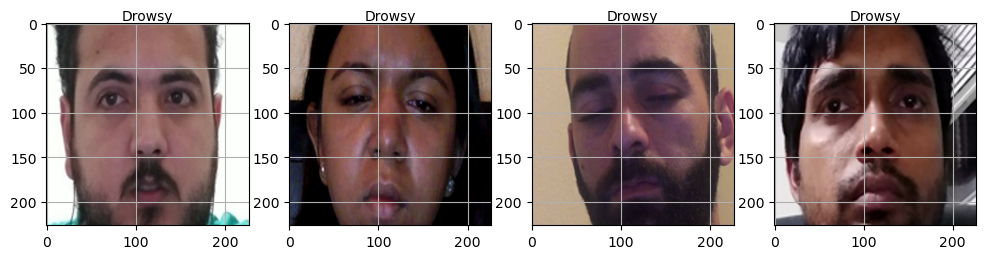

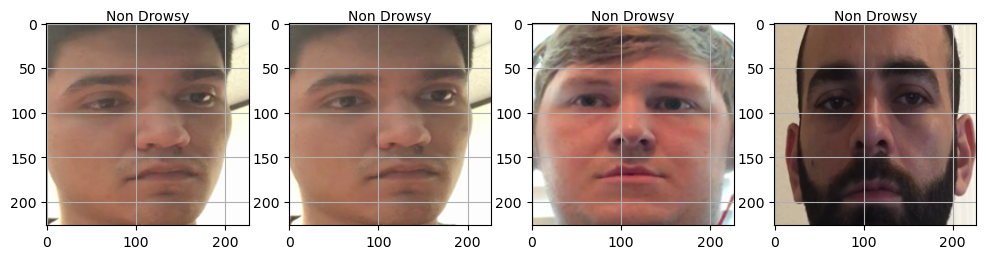

In [38]:
display_orig_data_set_eda()
plot_images(original_dataset_train_drowsy_dir, title= 'Drowsy')
plot_images(original_dataset_train_nondrowsy_dir, title= 'Non Drowsy')

# Data Annotation
A comprehensive dataset comprising 510 images underwent manual annotation. These images are designated for training, validation, and testing purposes. They are to be divided into respective subsets for training, validation, and testing, adhering to a proportional allocation of 60%, 10%, and 30%. Given the nature of the labeling process, which involved approximately 10 images per individual, there exists a potential overlap wherein the test subset might include images of individuals previously encountered during the model's training phase. To address this and to assess the model's performance with previously unseen data, a distinct set of images, specifically those featuring individuals whose names commence with letters S through Z, has been segregated. This measure is intended to evaluate the model's generalization capabilities on novel data.

,Category,Count
0,Drowsy,276
1,Non Drowsy,234


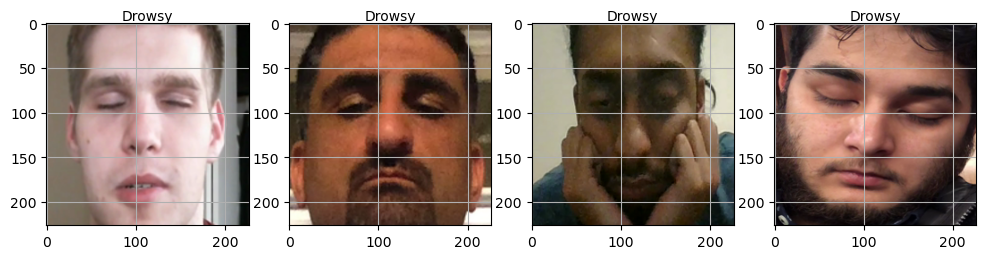

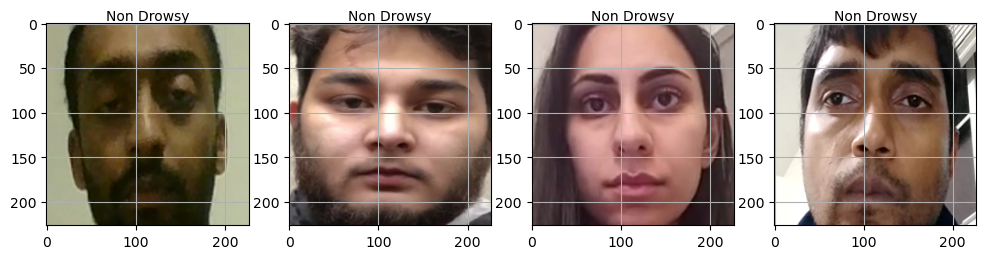

In [39]:
display_annotated_eda()
plot_images(ff_train_drowsy_dir, title= 'Drowsy')
plot_images(ff_train_nondrowsy_dir, title= 'Non Drowsy')

# Data Preprocessing

The preprocessing of the image dataset will be executed through a two-stage process. Initially, the first stage will involve the random selection of 150 images each from directories labeled 'Drowsy' and 'NonDrowsy'. Selecting equal images would balance our dataset. In this phase, images from the 'Drowsy' directory will be annotated with a label of 1, while those from the 'NonDrowsy' directory will receive a label of 0, thus facilitating binary classification.

Subsequently, the second stage of preprocessing will focus on standardizing the dimensions of the images to a uniform size of 80x80 pixels. The data is split in training and validation at this step. Additionally, this stage will incorporate various image augmentation techniques, including the adjustment of brightness and contrast, as well as the horizontal flipping of images. These augmented images will then be systematically incorporated into the training dataset, thereby enriching it and potentially enhancing the robustness of the model by exposing it to a more diverse range of data variations.

Around 30 percent of test images are stored in a [test](./data/ff_manual_annotate/test/) directory and would be used later for evaluation of model.

./data/ff_manual_annotate/train/NonDrowsy
./data/ff_manual_annotate/train/Drowsy


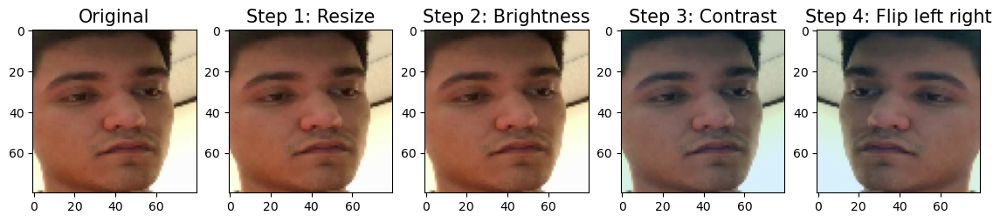

In [49]:
display_train_preprocess_sample()

# Model

## Model V1 - Base Model Architecture

TBD Writeup

<img src="./images/model_v1.png" alt="Alt Text" style="max-width: 1024px; max-height: 720px;">

## Model V1 - Training 

TBD Writeup

In [38]:
output_file_xls = results_dir + '/output_base_ff.xlsx'
output_file_csv = results_dir + '/output_base_ff.csv'

init_baseline_hyperparam()
base_model_ff_list, base_model_ff_acc_list = run_model_permutations(ff_train_dir,
                                                            ff_test_dir,
                                                            base_ff_plot_hist_dir,
                                                            base_ff_plot_cm_dir,
                                                            output_file_xls,
                                                            output_file_csv)

clear_output(wait=True)


Permutation 8/8
./data/ff_manual_annotate/train/NonDrowsy
./data/ff_manual_annotate/train/Drowsy

----------Preprocessing Summary----------
images shape (300, 80, 80, 3)
y shape (300,)
X_train shape (480, 80, 80, 3)
y_train shape (480,)
X_val shape (60, 80, 80, 3)
y_val shape (60,)
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_1 (Conv2D)             (None, 80, 80, 128)       3584      
                                                                 
 activation (Activation)     (None, 80, 80, 128)       0         
                                                                 
 dropout (Dropout)           (None, 80, 80, 128)       0         
                                                                 
 pool_1 (MaxPooling2D)       (None, 40, 40, 128)       0         
                                                                 
 conv_2 (Conv2D)             (None, 4

## Model V1 - Hyperparameter Selection

TBD Writeup

In [45]:
base_ff_highest_accuracy_index = get_best_index(output_file_xls)

print("Best model index: " + str(base_ff_highest_accuracy_index))

,Learning Rate,Filters,Kernel Size,Strides,optimizer,Conv Dropout Rate,FC Dropout Rate,Units,Pool Size,Epochs,Batch Size,Train Accuracy,Validation Accuracy,Model Size,History Plot,Confusion Matrix,Distance
6,0.001,"[128, 256, 360]","[(3, 3), (3, 3)]","[(1, 1), (1, 1), (1, 1)]",adam,"[0.4, 0.2, 0.2]","[0, 0, 0]","[256, 128, 16]","[(2, 2), (2, 2), (2, 2)]",15,16,1,1.000000,101.274052,./plots/base_full_face/hist/history_7.png,./plots/base_full_face/cm/confusion_matrix_7.png,0.000000
2,0.001,"[128, 320, 480]","[(3, 3), (3, 3)]","[(1, 1), (1, 1), (1, 1)]",adam,"[0.4, 0.2, 0.2]","[0, 0, 0]","[256, 128, 16]","[(2, 2), (2, 2), (2, 2)]",15,16,1,1.000000,126.555546,./plots/base_full_face/hist/history_3.png,./plots/base_full_face/cm/confusion_matrix_3.png,0.000000
5,0.001,"[128, 256, 360]","[(3, 3), (3, 3)]","[(1, 1), (1, 1), (1, 1)]",adam,"[0.4, 0.2, 0.2]","[0, 0, 0]","[384, 128, 32]","[(2, 2), (2, 2), (2, 2)]",25,16,1,1.000000,151.344975,./plots/base_full_face/hist/history_6.png,./plots/base_full_face/cm/confusion_matrix_6.png,0.000000
0,0.001,"[128, 320, 480]","[(3, 3), (3, 3)]","[(1, 1), (1, 1), (1, 1)]",adam,"[0.4, 0.2, 0.2]","[0, 0, 0]","[384, 128, 32]","[(2, 2), (2, 2), (2, 2)]",15,16,1,1.000000,189.126469,./plots/base_full_face/hist/history_1.png,./plots/base_full_face/cm/confusion_matrix_1.png,0.000000
7,0.001,"[128, 256, 360]","[(3, 3), (3, 3)]","[(1, 1), (1, 1), (1, 1)]",adam,"[0.4, 0.2, 0.2]","[0, 0, 0]","[256, 128, 16]","[(2, 2), (2, 2), (2, 2)]",25,16,1,0.983333,101.274052,./plots/base_full_face/hist/history_8.png,./plots/base_full_face/cm/confusion_matrix_8.png,0.016667
3,0.001,"[128, 320, 480]","[(3, 3), (3, 3)]","[(1, 1), (1, 1), (1, 1)]",adam,"[0.4, 0.2, 0.2]","[0, 0, 0]","[256, 128, 16]","[(2, 2), (2, 2), (2, 2)]",25,16,1,0.983333,126.555546,./plots/base_full_face/hist/history_4.png,./plots/base_full_face/cm/confusion_matrix_4.png,0.016667
4,0.001,"[128, 256, 360]","[(3, 3), (3, 3)]","[(1, 1), (1, 1), (1, 1)]",adam,"[0.4, 0.2, 0.2]","[0, 0, 0]","[384, 128, 32]","[(2, 2), (2, 2), (2, 2)]",15,16,1,0.983333,151.344975,./plots/base_full_face/hist/history_5.png,./plots/base_full_face/cm/confusion_matrix_5.png,0.016667
1,0.001,"[128, 320, 480]","[(3, 3), (3, 3)]","[(1, 1), (1, 1), (1, 1)]",adam,"[0.4, 0.2, 0.2]","[0, 0, 0]","[384, 128, 32]","[(2, 2), (2, 2), (2, 2)]",25,16,1,0.966667,189.126469,./plots/base_full_face/hist/history_2.png,./plots/base_full_face/cm/confusion_matrix_2.png,0.033333


Best model index: 6


## Model V1 - Training History & Confusion Matrix

TBD Writeup

History plot for the selected model at index: 6


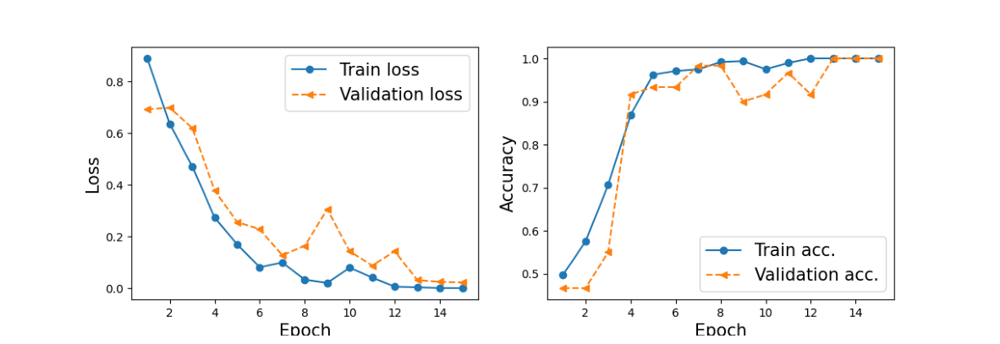

Confusion Matrix for the selected model at index: 6


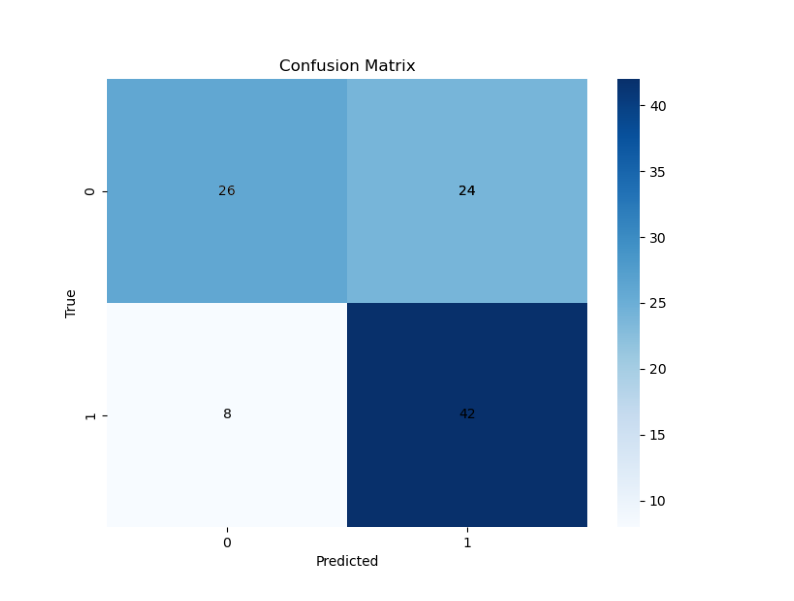

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_1 (Conv2D)             (None, 80, 80, 128)       3584      
                                                                 
 activation (Activation)     (None, 80, 80, 128)       0         
                                                                 
 dropout (Dropout)           (None, 80, 80, 128)       0         
                                                                 
 pool_1 (MaxPooling2D)       (None, 40, 40, 128)       0         
                                                                 
 conv_2 (Conv2D)             (None, 40, 40, 256)       295168    
                                                                 
 activation_1 (Activation)   (None, 40, 40, 256)       0         
                                                                 
 dropout_1 (Dropout)         (None, 40, 40, 256)       0

In [46]:
display_history_cm_summary(base_model_ff_list, base_ff_highest_accuracy_index, base_ff_plot_hist_dir, base_ff_plot_cm_dir)




# Model V2 - Architecture Updates to V1

Model would be trained using various permutations of hyperparameters defined and evaluated against test data

<img src="./images/model_architecture.png" alt="Alt Text" style="max-width: 1024px; max-height: 720px;">

## Model V2 - Training Updated Model

Our model is subjected to training using a set of 96 hyperparameter combinations. The arrangement of hyperparameters is established by considering factors such as learning rate, optimizer choice, filter configuration, kernel size, stride length, pooling size, dropout rates for convolutional and fully connected layers, batch normalization for convolutional and fully connected layers, activation functions, number of units, training epochs, and batch size. For each specific hyperparameter combination, the resulting set of hyperparameters, test accuracy, and recall rates are recorded and stored in the [results](./results/output_ff.xlsx) directory. Additionally, historical plots representing various permutations are preserved in the [history](./plots/full_face/history) directory, while confusion matrices for each permutation are stored in the [confusion](./plots/full_face/cm) matrix directory.

In [40]:
import numpy as np

output_file_xls = results_dir + '/output_ff.xlsx'
output_file_csv = results_dir + '/output_ff.csv'

init_hyper_param()
model_ff_list, model_ff_acc_list = run_model_permutations(ff_train_dir,
                                                            ff_test_dir,
                                                            ff_plot_hist_dir,
                                                            ff_cm_plot_dir,
                                                            output_file_xls,
                                                            output_file_csv)

clear_output(wait=True)

Permutation 96/96
./data/ff_manual_annotate/train/NonDrowsy
./data/ff_manual_annotate/train/Drowsy

----------Preprocessing Summary----------
images shape (300, 80, 80, 3)
y shape (300,)
X_train shape (480, 80, 80, 3)
y_train shape (480,)
X_val shape (60, 80, 80, 3)
y_val shape (60,)
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_1 (Conv2D)             (None, 80, 80, 8)         224       
                                                                 
 batch_normalization (Batch  (None, 80, 80, 8)         32        
 Normalization)                                                  
                                                                 
 activation (Activation)     (None, 80, 80, 8)         0         
                                                                 
 dropout (Dropout)           (None, 80, 80, 8)         0         
                                   

2023-12-09 23:15:19.274090: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


8/8 [==============================] - 2s 16ms/step - loss: 0.7237 - accuracy: 0.5000 - val_loss: 0.6941 - val_accuracy: 0.4667
Epoch 2/40
8/8 [==============================] - 0s 9ms/step - loss: 0.6838 - accuracy: 0.5375 - val_loss: 0.6989 - val_accuracy: 0.4667
Epoch 3/40
8/8 [==============================] - 0s 8ms/step - loss: 0.6586 - accuracy: 0.5833 - val_loss: 0.6932 - val_accuracy: 0.4667
Epoch 4/40
8/8 [==============================] - 0s 9ms/step - loss: 0.6199 - accuracy: 0.6187 - val_loss: 0.6933 - val_accuracy: 0.4667
Epoch 5/40
8/8 [==============================] - 0s 9ms/step - loss: 0.5758 - accuracy: 0.6729 - val_loss: 0.6883 - val_accuracy: 0.4667
Epoch 6/40
8/8 [==============================] - 0s 9ms/step - loss: 0.5151 - accuracy: 0.7250 - val_loss: 0.6799 - val_accuracy: 0.4667
Epoch 7/40
8/8 [==============================] - 0s 8ms/step - loss: 0.4282 - accuracy: 0.7937 - val_loss: 0.6747 - val_accuracy: 0.4667
Epoch 8/40
8/8 [============================

## Model V2 - Best Hyperparamaters

TBD Writeup

In [42]:
ff_index = get_best_index(results_dir + '/output_ff.xlsx')
model_ff = model_ff_list[ff_index]

,Learning Rate,Filters,Kernel Size,Strides,optimizer,Conv Dropout Rate,FC Dropout Rate,Units,Pool Size,Epochs,Batch Size,Train Accuracy,Validation Accuracy,Model Size,History Plot,Confusion Matrix,Distance
56,0.001,"[8, 16]","[(5, 5), (5, 5)]","[(1, 1), (1, 1)]",adam,"[0.3, 0.5]","[0.5, 0, 0]","[64, 64, 32]","[(2, 2), (2, 2)]",30,64,0.991667,1.000000,1.603092,./plots/full_face/hist/history_57.png,./plots/full_face/cm/confusion_matrix_57.png,0.008333
11,0.001,"[16, 16]","[(5, 5), (5, 5)]","[(1, 1), (1, 1)]",adam,"[0.3, 0.5]","[0.5, 0, 0]","[64, 64, 32]","[(2, 2), (2, 2)]",40,64,0.991667,1.000000,1.617741,./plots/full_face/hist/history_12.png,./plots/full_face/cm/confusion_matrix_12.png,0.008333
13,0.001,"[16, 16]","[(3, 3), (3, 3)]","[(1, 1), (1, 1)]",adam,"[0.3, 0.5]","[0.5, 0, 0]","[128, 64, 32]","[(2, 2), (2, 2)]",30,32,0.991667,1.000000,3.177555,./plots/full_face/hist/history_14.png,./plots/full_face/cm/confusion_matrix_14.png,0.008333
94,0.001,"[8, 8]","[(3, 3), (3, 3)]","[(1, 1), (1, 1)]",adam,"[0.3, 0.5]","[0.5, 0, 0]","[64, 64, 32]","[(2, 2), (2, 2)]",40,32,0.989583,1.000000,0.810215,./plots/full_face/hist/history_95.png,./plots/full_face/cm/confusion_matrix_95.png,0.010417
22,0.001,"[16, 16]","[(3, 3), (3, 3)]","[(1, 1), (1, 1)]",adam,"[0.3, 0.5]","[0.5, 0, 0]","[64, 64, 32]","[(2, 2), (2, 2)]",40,32,0.989583,1.000000,1.599186,./plots/full_face/hist/history_23.png,./plots/full_face/cm/confusion_matrix_23.png,0.010417
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44,0.001,"[16, 8]","[(3, 3), (3, 3)]","[(1, 1), (1, 1)]",adam,"[0.3, 0.5]","[0.5, 0, 0]","[64, 64, 32]","[(2, 2), (2, 2)]",30,64,0.985417,0.750000,0.813389,./plots/full_face/hist/history_45.png,./plots/full_face/cm/confusion_matrix_45.png,0.235417
62,0.001,"[8, 16]","[(3, 3), (3, 3)]","[(1, 1), (1, 1)]",adam,"[0.3, 0.5]","[0.5, 0, 0]","[128, 64, 32]","[(2, 2), (2, 2)]",30,64,0.983333,0.616667,3.172184,./plots/full_face/hist/history_63.png,./plots/full_face/cm/confusion_matrix_63.png,0.366667
20,0.001,"[16, 16]","[(3, 3), (3, 3)]","[(1, 1), (1, 1)]",adam,"[0.3, 0.5]","[0.5, 0, 0]","[64, 64, 32]","[(2, 2), (2, 2)]",30,64,0.979167,0.616667,1.599186,./plots/full_face/hist/history_21.png,./plots/full_face/cm/confusion_matrix_21.png,0.362500
86,0.001,"[8, 8]","[(3, 3), (3, 3)]","[(1, 1), (1, 1)]",adam,"[0.3, 0.5]","[0.5, 0, 0]","[128, 64, 32]","[(2, 2), (2, 2)]",30,64,0.977083,0.616667,1.607334,./plots/full_face/hist/history_87.png,./plots/full_face/cm/confusion_matrix_87.png,0.360417


## Model V2 - Training History & Confusion Matrix

TBD Writeup

Test Accuracy:  76.99999809265137
History plot for the selected model at index: 56


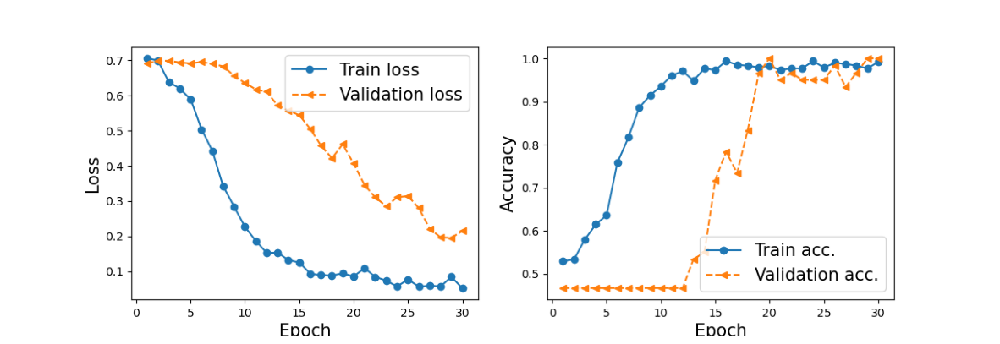

Confusion Matrix for the selected model at index: 56


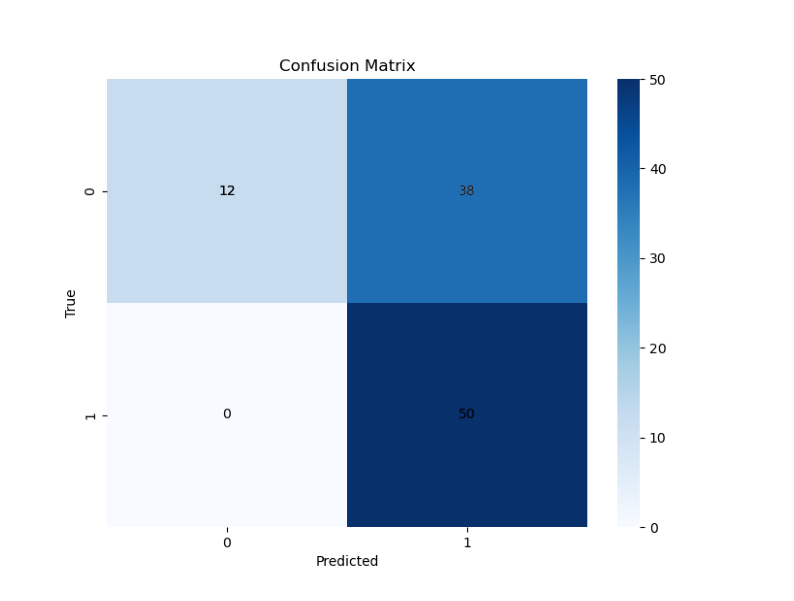

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_1 (Conv2D)             (None, 80, 80, 8)         608       
                                                                 
 batch_normalization (Batch  (None, 80, 80, 8)         32        
 Normalization)                                                  
                                                                 
 activation (Activation)     (None, 80, 80, 8)         0         
                                                                 
 dropout (Dropout)           (None, 80, 80, 8)         0         
                                                                 
 pool_1 (MaxPooling2D)       (None, 40, 40, 8)         0         
                                                                 
 conv_2 (Conv2D)             (None, 40, 40, 16)        3216      
                                                        

In [45]:
accuracy = model_ff_acc_list[ff_index]

print ("Test Accuracy: ", str(accuracy[2]))
display_history_cm_summary(model_ff_list, ff_index, ff_plot_hist_dir, ff_cm_plot_dir)


# Feature Reduction (Focus Eye)

In order to enhance the precision of recall and the overall generalization capabilities of our drowsiness detection system, we redirected our attention towards the meticulous examination of the ocular region, as opposed to the comprehensive analysis of the entire facial region. This strategic shift in focus was supported by the integration of external software libraries, specifically, 'face_recognition' and 'dlib', which facilitated the accurate extraction of the ocular regions from our meticulously annotated image dataset. Subsequently, these meticulously cropped ocular images were harnessed for the purposes of training, validation, and testing within the framework of our model. It is noteworthy that our analysis considered a single eye from each subject during this process.

,Category,Count
0,Drowsy,266
1,Non Drowsy,228


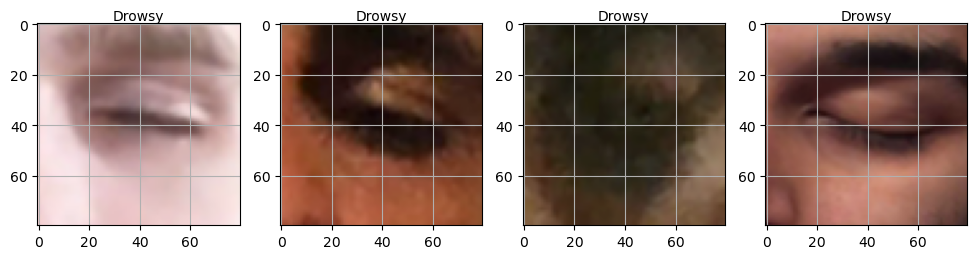

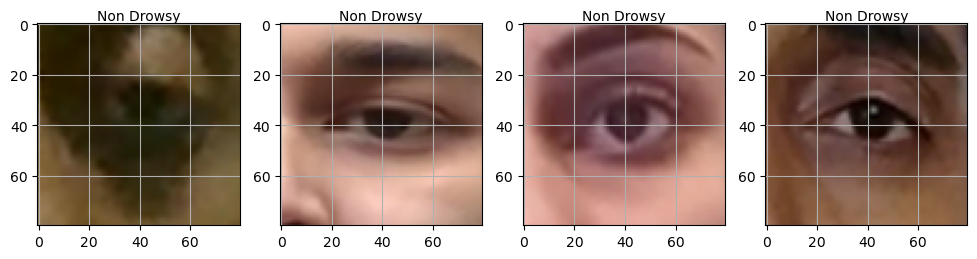

In [46]:
display_eye_eda()
plot_images(directory = eye_train_drowsy_dir, title = 'Drowsy')
plot_images(directory = eye_train_nondrowsy_dir, title = 'Non Drowsy')

## Model V3 - Training 

The architecture of model V3 is similar to architecture of model V2. This model is also subjected to train against 96 permuatations of hyperparameters similar to Model V2. For each specific hyperparameter combination, the resulting set of hyperparameters, test accuracy, and recall rates are recorded and stored in the [results](./results/output_eye.xlsx) directory. Additionally, historical plots representing various permutations are preserved in the [history](./plots/eye/history) directory, while confusion matrices for each permutation are stored in the [confusion](./plots/eye/cm) matrix directory. 

In [47]:
import numpy as np

output_file_xls = results_dir + '/output_eye.xlsx'
output_file_csv = results_dir + '/output_eye.csv'

init_hyper_param()
model_eye_list, model_eye_acc_list = run_model_permutations(eye_train_dir,
                                                            eye_test_dir,
                                                            eye_plot_hist_dir,
                                                            eye_cm_plot_dir,
                                                            output_file_xls,
                                                            output_file_csv)

clear_output(wait=True)

Permutation 96/96
./data/eye_cropped/train/NonDrowsy
./data/eye_cropped/train/Drowsy

----------Preprocessing Summary----------
images shape (300, 80, 80, 3)
y shape (300,)
X_train shape (480, 80, 80, 3)
y_train shape (480,)
X_val shape (60, 80, 80, 3)
y_val shape (60,)
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_1 (Conv2D)             (None, 80, 80, 8)         224       
                                                                 
 batch_normalization (Batch  (None, 80, 80, 8)         32        
 Normalization)                                                  
                                                                 
 activation (Activation)     (None, 80, 80, 8)         0         
                                                                 
 dropout (Dropout)           (None, 80, 80, 8)         0         
                                                 

## Model V3 - Best Hyperparameters

TBD Writeup

In [48]:
eye_index = get_best_index(results_dir + '/output_eye.xlsx')
model_eye = model_eye_list[eye_index] 

,Learning Rate,Filters,Kernel Size,Strides,optimizer,Conv Dropout Rate,FC Dropout Rate,Units,Pool Size,Epochs,Batch Size,Train Accuracy,Validation Accuracy,Model Size,History Plot,Confusion Matrix,Distance
16,0.001,"[16, 16]","[(3, 3), (3, 3)]","[(1, 1), (1, 1)]",adam,"[0.3, 0.5]","[0.5, 0, 0]","[128, 64, 32]","[(2, 2), (2, 2)]",40,32,0.991667,1.000000,3.177555,./plots/eye/hist/history_17.png,./plots/eye/cm/confusion_matrix_17.png,0.008333
52,0.001,"[8, 16]","[(5, 5), (5, 5)]","[(1, 1), (1, 1)]",adam,"[0.3, 0.5]","[0.5, 0, 0]","[128, 64, 32]","[(2, 2), (2, 2)]",40,32,0.983333,1.000000,3.181461,./plots/eye/hist/history_53.png,./plots/eye/cm/confusion_matrix_53.png,0.016667
67,0.001,"[8, 16]","[(3, 3), (3, 3)]","[(1, 1), (1, 1)]",adam,"[0.3, 0.5]","[0.5, 0, 0]","[64, 64, 32]","[(2, 2), (2, 2)]",30,32,0.979167,1.000000,1.593815,./plots/eye/hist/history_68.png,./plots/eye/cm/confusion_matrix_68.png,0.020833
74,0.001,"[8, 8]","[(5, 5), (5, 5)]","[(1, 1), (1, 1)]",adam,"[0.3, 0.5]","[0.5, 0, 0]","[128, 64, 32]","[(2, 2), (2, 2)]",30,64,0.993750,0.983333,1.612705,./plots/eye/hist/history_75.png,./plots/eye/cm/confusion_matrix_75.png,0.010417
76,0.001,"[8, 8]","[(5, 5), (5, 5)]","[(1, 1), (1, 1)]",adam,"[0.3, 0.5]","[0.5, 0, 0]","[128, 64, 32]","[(2, 2), (2, 2)]",40,32,0.989583,0.983333,1.612705,./plots/eye/hist/history_77.png,./plots/eye/cm/confusion_matrix_77.png,0.006250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47,0.001,"[16, 8]","[(3, 3), (3, 3)]","[(1, 1), (1, 1)]",adam,"[0.3, 0.5]","[0.5, 0, 0]","[64, 64, 32]","[(2, 2), (2, 2)]",40,64,0.983333,0.533333,0.813389,./plots/eye/hist/history_48.png,./plots/eye/cm/confusion_matrix_48.png,0.450000
92,0.001,"[8, 8]","[(3, 3), (3, 3)]","[(1, 1), (1, 1)]",adam,"[0.3, 0.5]","[0.5, 0, 0]","[64, 64, 32]","[(2, 2), (2, 2)]",30,64,0.977083,0.533333,0.810215,./plots/eye/hist/history_93.png,./plots/eye/cm/confusion_matrix_93.png,0.443750
20,0.001,"[16, 16]","[(3, 3), (3, 3)]","[(1, 1), (1, 1)]",adam,"[0.3, 0.5]","[0.5, 0, 0]","[64, 64, 32]","[(2, 2), (2, 2)]",30,64,0.972917,0.533333,1.599186,./plots/eye/hist/history_21.png,./plots/eye/cm/confusion_matrix_21.png,0.439583
68,0.001,"[8, 16]","[(3, 3), (3, 3)]","[(1, 1), (1, 1)]",adam,"[0.3, 0.5]","[0.5, 0, 0]","[64, 64, 32]","[(2, 2), (2, 2)]",30,64,0.968750,0.533333,1.593815,./plots/eye/hist/history_69.png,./plots/eye/cm/confusion_matrix_69.png,0.435417


## Model V3 - Training History & Confusion Matrix

TBD Writeup

Test Accuracy:  88.99999856948853
History plot for the selected model at index: 16


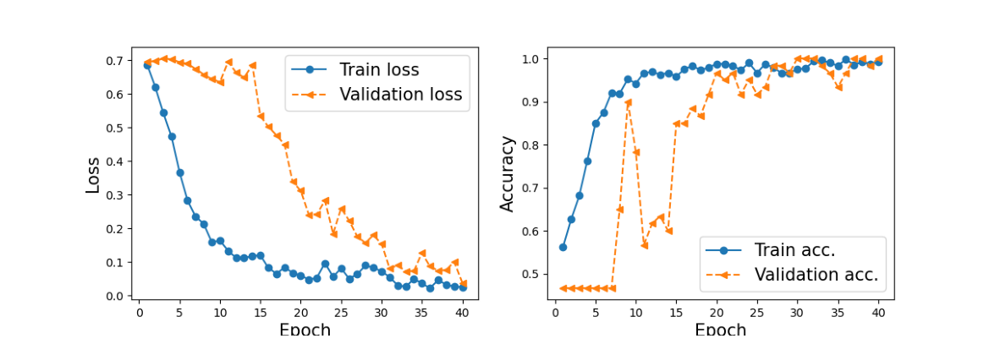

Confusion Matrix for the selected model at index: 16


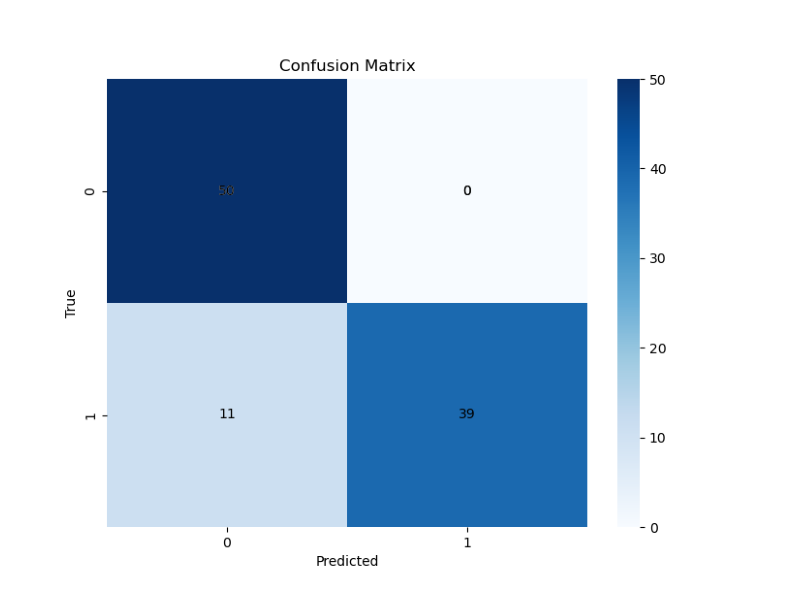

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_1 (Conv2D)             (None, 80, 80, 16)        448       
                                                                 
 batch_normalization (Batch  (None, 80, 80, 16)        64        
 Normalization)                                                  
                                                                 
 activation (Activation)     (None, 80, 80, 16)        0         
                                                                 
 dropout (Dropout)           (None, 80, 80, 16)        0         
                                                                 
 pool_1 (MaxPooling2D)       (None, 40, 40, 16)        0         
                                                                 
 conv_2 (Conv2D)             (None, 40, 40, 16)        2320      
                                                        

In [49]:
accuracy = model_eye_acc_list[eye_index]
print ("Test Accuracy: ", str(accuracy[2]))
display_history_cm_summary(model_eye_list, eye_index, eye_plot_hist_dir, eye_cm_plot_dir)

# Results

## Model V2 - Predictions & Filter Map Activations

TBD Writeup

./data/ff_manual_annotate/test/NonDrowsy
./data/ff_manual_annotate/test/Drowsy
4/4 [==============================] - 0s 2ms/step


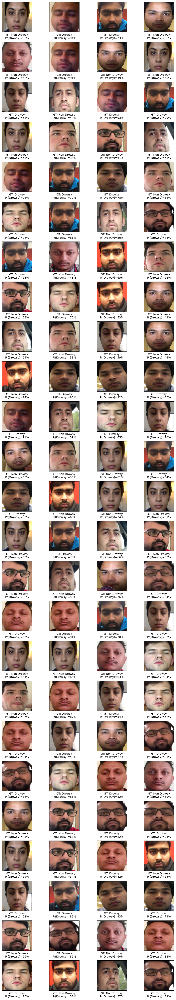

Shape of image: (1, 80, 80, 3)


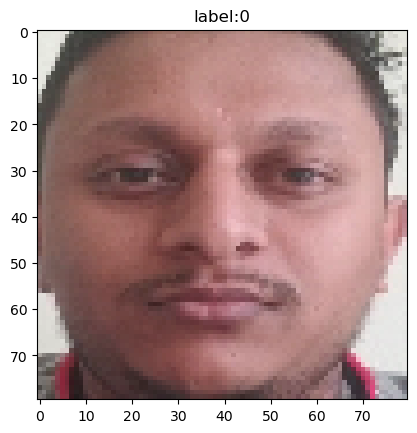

1/1 [==============================] - 0s 96ms/step


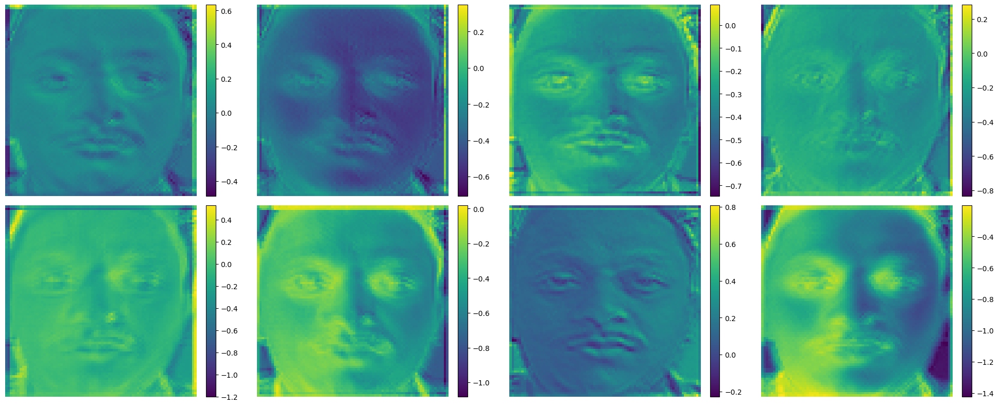

1/1 [==============================] - 0s 90ms/step


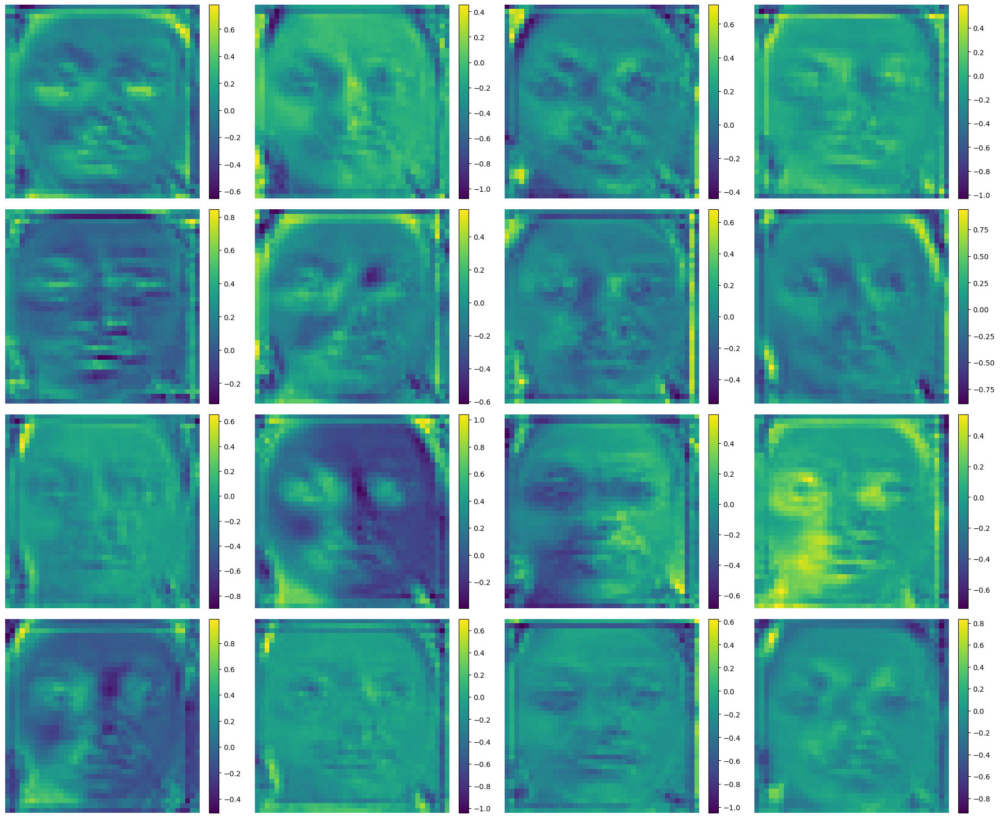

In [50]:
predict_results(model_ff, ff_test_dir)

## Model V3 - Predictions & Filter Map Activations

TBD Writeup

./data/eye_cropped/test/NonDrowsy
./data/eye_cropped/test/Drowsy
4/4 [==============================] - 0s 2ms/step


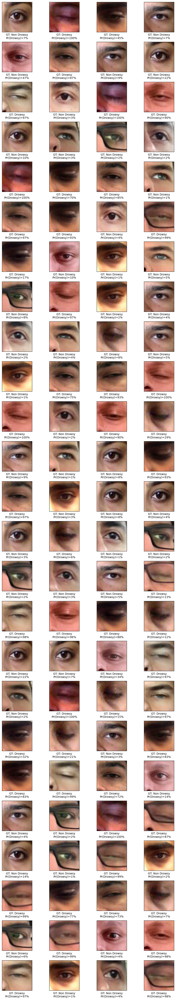

Shape of image: (1, 80, 80, 3)


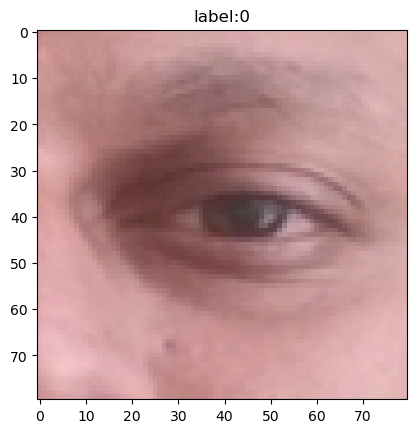

1/1 [==============================] - 0s 97ms/step


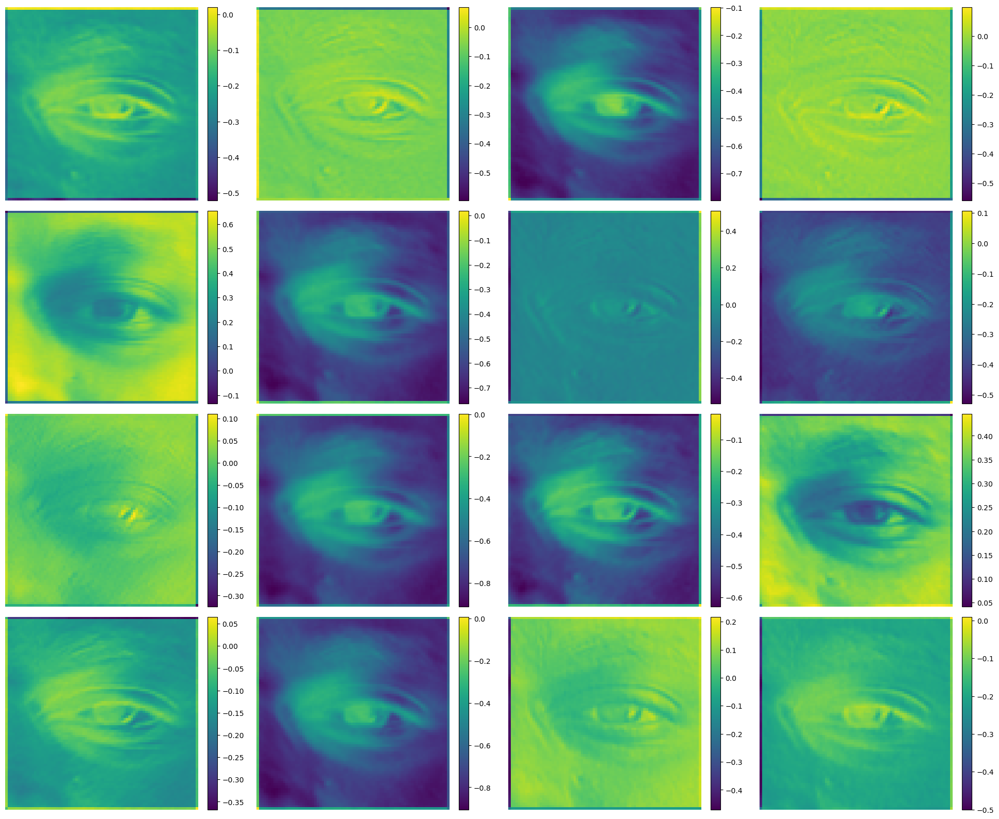

1/1 [==============================] - 0s 86ms/step


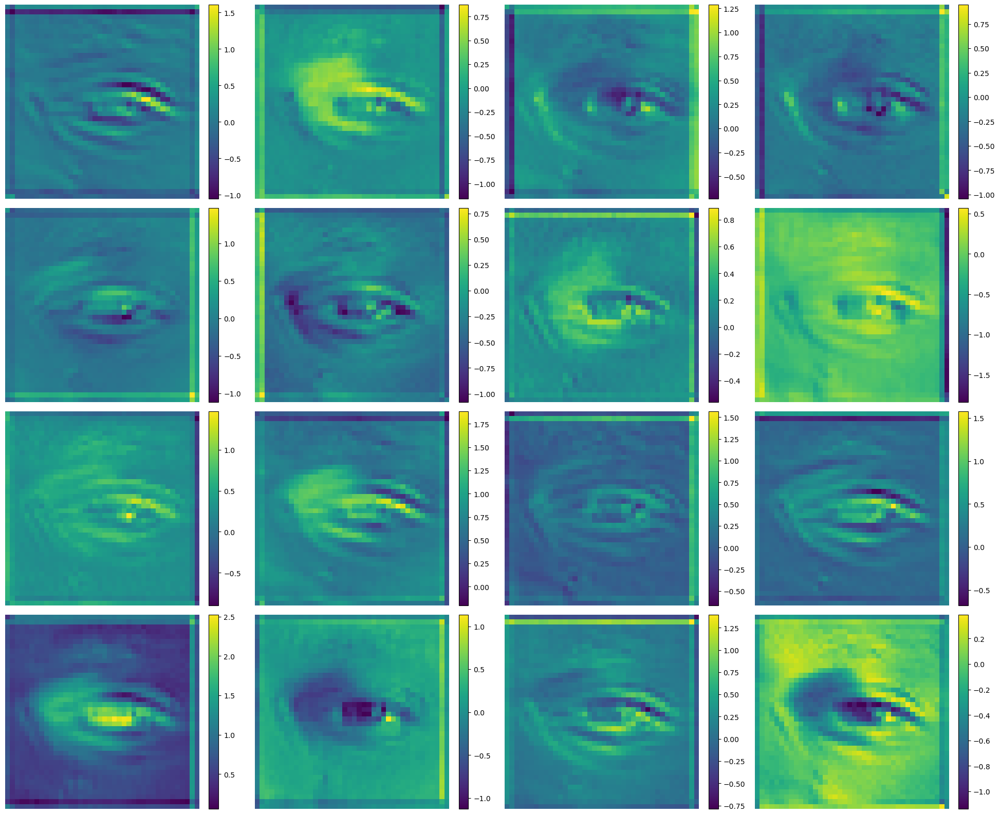

In [51]:
predict_results(model_eye, eye_test_dir)

#### Conclusion

TBD Writeup


#### Aditional HyperParameters Experimented

In [ ]:
from itertools import product

learning_rate               =   [0.001,
                                 0.01]
 
optimizer                   =   ['adam',
                                 'adagrad', 
                                 'sgd']
                                 
                        
filters                     =   [[16,16],
                                 [16,8],
                                 [8,16], 
                                 [8,8]] 

kernel_size                 =   [[(5,5),(5,5)], 
                                 [(3,3),(3,3)], 
                                 [(3,3),(5,5)], 
                                 [(5,5),(3,3)]]
 
strides                     =   [[(1,1),(1,1)], 
                                 [(2,2),(2,2)]]

pool_size                   =   [[(2,2),(2,2)]]
                        
conv_dropout_rate           =   [[0.3, 0.5]]

fc_dropout_rate             =   [[0.5, 0, 0]]

conv_batch_normalization    =   [[True, True]]

fc_batch_normalization      =   [[False, True, True]]

activations                 =   [['relu', 'relu', 'relu', 'relu', 'relu']]
                        
units                       =   [[128, 64, 32],
                                 [64, 64, 32]]

epochs                      =   [10, 20, 30, 40]


def build_permutations(lists):

    # Generate permutations of one element from each list
    all_permutations = list(product(*lists))

    # Print the permutations
    for idx, permutation in enumerate(all_permutations, start=1):
        print(f"Permutation {idx}: {permutation}")


    permutation = all_permutations[0]
    print(permutation[0])

lists = [learning_rate, optimizer, filters, kernel_size, strides, pool_size, conv_dropout_rate, fc_dropout_rate, conv_batch_normalization, fc_batch_normalization, activations, units, epochs]
build_permutations(lists)

In [ ]:
NUM_EXP = 5

learning_rate               =   [0.001,
                                 0.001,
                                 0.001,
                                 0.001,
                                 0.001]
 
optimizer                   =   ['adam',
                                 'adam', 
                                 'adam', 
                                 'adam',
                                 'adam']
                                 
                        
filters                     =   [[16,16],
                                 [16,16],
                                 [16,16], 
                                 [16,16],
                                 [16,16]] 

kernel_size                 =   [[(5,5),(5,5)], 
                                 [(3,3),(3,3)], 
                                 [(3,3), (5,5)], 
                                 [(5,5), (3,3)],
                                 [(5,5),(5,5)]]
 
strides                     =   [[(1,1),(1,1)], 
                                 [(1,1),(1,1)], 
                                 [(1,1),(1,1)], 
                                 [(1,1),(1,1)],
                                 [(1,1),(1,1)]]

pool_size                   =   [[(2,2),(2,2)],
                                 [(2,2),(2,2)],
                                 [(2,2),(2,2)], 
                                 [(2,2),(2,2)],
                                 [(2,2),(2,2)]]
                        
conv_dropout_rate           =   [[0.3, 0.5],
                                 [0.3, 0.5], 
                                 [0.3, 0.5], 
                                 [0.3, 0.5],
                                 [0.3, 0.5]]

fc_dropout_rate             =   [[0.5, 0, 0],
                                 [0.5, 0, 0], 
                                 [0.5, 0, 0], 
                                 [0.5, 0, 0],
                                 [0.5, 0, 0]]

conv_batch_normalization    =   [[True, True],
                                 [True, True], 
                                 [True, True], 
                                 [True, True],
                                 [True, True]]

fc_batch_normalization      =   [[False, True, True],
                                 [False, True, True], 
                                 [False, True, True], 
                                 [False, True, True],
                                 [False, True, True]]

activations                 =   [['relu', 'relu', 'relu', 'relu', 'relu'],
                                 ['relu', 'relu', 'relu', 'relu', 'relu'],
                                 ['relu', 'relu', 'relu', 'relu', 'relu'],
                                 ['relu', 'relu', 'relu', 'relu', 'relu'],
                                 ['relu', 'relu', 'relu', 'relu', 'relu']]
                        
units                       =   [[128, 64, 32],
                                 [128, 64, 32],
                                 [128, 64, 32],
                                 [128, 64, 32],
                                 [64, 64, 32]]

In [ ]:
from itertools import product

learning_rate               =   [0.001,
                                 0.01]
 
optimizer                   =   ['adam',
                                 'adagrad', 
                                 'sgd']
                                 
                        
filters                     =   [[16,16],
                                 [16,8],
                                 [8,16], 
                                 [8,8]] 

kernel_size                 =   [[(5,5),(5,5)], 
                                 [(3,3),(3,3)]]
                                 
 
strides                     =   [[(1,1),(1,1)], 
                                 [(2,2),(2,2)]]

pool_size                   =   [[(2,2),(2,2)]]
                        
conv_dropout_rate           =   [[0.3, 0.5]]

fc_dropout_rate             =   [[0.5, 0, 0]]

conv_batch_normalization    =   [[True, True]]

fc_batch_normalization      =   [[False, True, True]]

activations                 =   [['relu', 'relu', 'relu', 'relu', 'relu']]
                        
units                       =   [[128, 64, 32],
                                 [64, 64, 32]]

epochs                      =   [20, 30, 40]


In [ ]:
# FF Best Configuration

learning_rate               =   [0.001]
 
optimizer                   =   ['adam']
                                 
                        
filters                     =   [[16,8]]

kernel_size                 =   [[(5,5),(5,5)]] 
                                 
 
strides                     =   [[(1,1),(1,1)]]

pool_size                   =   [[(2,2),(2,2)]]
                        
conv_dropout_rate           =   [[0.3, 0.5]]

fc_dropout_rate             =   [[0.5, 0, 0]]

conv_batch_normalization    =   [[True, True]]

fc_batch_normalization      =   [[False, True, True]]

activations                 =   [['relu', 'relu', 'relu', 'relu', 'relu']]
                        
units                       =   [[64, 64, 32]]

epochs                      =   [40]

batch_size                  =   [16]

In [ ]:
# Eye Best Configuration


learning_rate               =   [0.001]
 
optimizer                   =   ['adam']
                                 
                        
filters                     =   [[8,8]]

kernel_size                 =   [[(5,5),(5,5)]] 
                                 
 
strides                     =   [[(1,1),(1,1)]]

pool_size                   =   [[(2,2),(2,2)]]
                        
conv_dropout_rate           =   [[0.3, 0.5]]

fc_dropout_rate             =   [[0.5, 0, 0]]

conv_batch_normalization    =   [[True, True]]

fc_batch_normalization      =   [[False, True, True]]

activations                 =   [['relu', 'relu', 'relu', 'relu', 'relu']]
                        
units                       =   [[64, 64, 32]]

epochs                      =   [30]

batch_size                  =   [16]